In [3]:
import os
import sys
import numpy as np
from sklearn.decomposition import PCA


sys.path.insert(1, os.getenv("MOMAPS_HOME"))
from src.common.lib.utils import load_config_file
from src.datasets.dataset_spd import DatasetSPD
from src.common.lib.embeddings_utils import load_embeddings
import src.common.lib.synthetic_multiplexing as synthetic_multiplexing

from matplotlib import cm
import matplotlib.pyplot as plt

from sklearn.metrics import precision_recall_curve, average_precision_score, roc_curve, auc, RocCurveDisplay, \
    balanced_accuracy_score, roc_auc_score, classification_report, confusion_matrix, multilabel_confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
import matplotlib
from collections import defaultdict, Counter

from sklearn.preprocessing import label_binarize
from sklearn.preprocessing import OneHotEncoder

from sklearn.base import clone
from sklearn.svm import SVC

%matplotlib inline
%load_ext autoreload 
%autoreload 2





/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/labs/hornsteinla

MOMAPS_HOME: /home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/umap/umap_.py:660: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()


# utils

In [4]:
def fit_and_plot_multiclass_cv_auc_roc_curves(estimator, cv_k_fold, X, y, n_classes,
                                              class_names, colors, sample_weight=None, title="", minimal_legend=False):
    """
    For every class, plot a curve per fold.
    A total of (n_classes * n_folds) AUC ROC curves are presented in the plot
    :param estimator:
    :param cv_k_fold:
    :param X:
    :param y:
    :param n_classes:
    :param title:
    :return:
    """

    tprs, aucs = [], []
    mean_fpr = np.linspace(0, 1, 100)
    _tpr, _fpr, _roc_auc = dict(), dict(), dict()
    _roc_auc2 = defaultdict(list)
    fig, ax = plt.subplots(figsize=(5, 5))
        

    for i, (train_fold, test_fold) in enumerate(cv_k_fold.split(X, y)):
        estimator_copy = clone(estimator)
        # -------- -------- -------- -------- -------- --------
        # Train a model on the train set
        estimator_copy.fit(X[train_fold], y[train_fold])
        # Get the true labels (classes)
        # Binarize labels in a one-vs-all fashion
        if n_classes == 2:
            print("n_classes =  2, therefore using one hot encoder")
            ohe = OneHotEncoder()
            y_true = ohe.fit_transform(y[test_fold].reshape(-1,1)).toarray()
        else:
            print("Using label binarize")
            y_true = label_binarize(y[test_fold], classes=class_names)
        # -------- -------- -------- -------- -------- --------
        # Validate on test set
        y_proba = estimator_copy.predict_proba(X[test_fold])
        
        print(y_true.shape, y_proba.shape)
        # -------- -------- -------- -------- -------- --------
        # For every class, plot a curve per fold (n_class * n_folds)
        for j, class_color, class_name in zip(range(n_classes), colors, class_names):

            # calculate AUC ROC - generate TPR and FPR curves
            _fpr[j], _tpr[j], _ = roc_curve(y_true[:, j],
                                          y_proba[:, j],
                                          #sample_weight=sample_weight,
                                          drop_intermediate=True)

            _roc_auc[j] = auc(_fpr[j], _tpr[j])
            _roc_auc2[class_name].append(_roc_auc[j])

            viz = RocCurveDisplay(fpr=_fpr[j], tpr=_tpr[j], roc_auc=_roc_auc[j], estimator_name=class_name)
            # Set a legend for each fold and each class
            viz.plot(ax=ax, name=class_name + ' fold {}'.format(i + 1), alpha=0.8, lw=1.8, linestyle=':',
                         color=class_color)

            interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
            interp_tpr[0] = 0.0
            tprs.append(interp_tpr)
            aucs.append(viz.roc_auc)
        # -------- -------- -------- -------- -------- --------

    ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='dimgray', label='Chance', alpha=.5)

    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    std_auc = np.std(aucs)
    ax.plot(mean_fpr, mean_tpr, color='black',
            label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
            lw=2, alpha=1.0)

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
    ax.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,
                    label=r'$\pm$ 1 std. dev.')

    ax.set(xlim=[-0.01, 1.05], ylim=[-0.01, 1.05])

    plt.title(title, color='black', fontsize=20)
    plt.xlabel('False Positive Rate (%)', fontsize=20, color='black')
    plt.ylabel('True Positive Rate (%)', fontsize=20, color='black')

    ax.legend(loc="lower right", prop={"size": 14}, bbox_to_anchor=(1.5, 1.5))

    plt.show()
    # plt.savefig(os.path.join(MAIN_FOLDER, 'figures', 'multiclass', 'AUC_ROC_per_class_training.png'), bbox_inches='tight',
    #             dpi=1200)
    plt.close()
    return np.asarray(aucs)

def plot_conf_matrix(clf, X_test, y_test, normalize='true'):
    from sklearn.metrics import ConfusionMatrixDisplay, multilabel_confusion_matrix, confusion_matrix

    unique_labels = np.unique(clf.classes_)
    print(unique_labels)

    predictions = clf.predict(X_test)
    conf_matrix = confusion_matrix(y_true=y_test, y_pred=predictions, labels=unique_labels, normalize=normalize)

    import seaborn as sns

    if normalize is None:
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=unique_labels, yticklabels=unique_labels)
    else:
        sns.heatmap(conf_matrix, annot=True, fmt='.2%', cmap='Blues', xticklabels=unique_labels, yticklabels=unique_labels)
    plt.show()

def validate_classifier(model, X, y, default_model_scorer, class_names, colors, sample_weight=None, title='', show_plot=False):
    """
    Perform full evaluation for a multi-class classifier on a given X and y

    :param model: sklearn Estimator (classifier)
    :param X: features matrix in a numpy matrix
    :param y: true labels in a numpy array (multi-class)
    :param default_model_scorer: string, sklearn.metric
    :param class_names: list of strings
    :param sample_weight: list of real numbers
    :param title: text
    :param show_plot: Boolean
    :return:

    """

    print("Validating - " + str(title) + "\n\n------------------")

    # -------- -------- -------- -------- -------- --------
    # Infer the probabilities for every class
    y_pred_prob = model.predict_proba(X)
    

    # Infer binary label to be used in classification_report()
    # by default, samples are classified to whichever class has the greatest probability (max)
    # y_pred_label = np.argmax(y_pred_prob, axis=1)  # nancy test
    y_pred = model.predict(X)
    
    # -------- -------- -------- -------- -------- --------

    print("\nBalanced accuracy score: " + str(balanced_accuracy_score(y_true=y, y_pred=y_pred, #sample_weight=sample_weight,
                            adjusted=False)) + ". \nBalanced accuracy score (adjusted): " + str(balanced_accuracy_score(y_true=y,
                                                                                                                        y_pred=y_pred,
                                                                                                                        #sample_weight=sample_weight,
                            adjusted=True)))
    # -------- -------- -------- -------- -------- --------
    macro_roc_auc_ovo = roc_auc_score(y, y_pred_prob, multi_class="ovo",
                                      average="macro")
    weighted_roc_auc_ovo = roc_auc_score(y, y_pred_prob, multi_class="ovo",
                                         average="weighted")

    macro_roc_auc_ovr = roc_auc_score(y, y_pred_prob, multi_class="ovr",
                                      average="macro" #, sample_weight=sample_weight
                                      )
    weighted_roc_auc_ovr = roc_auc_score(y, y_pred_prob, multi_class="ovr",
                                         average="weighted" #, sample_weight=sample_weight
    )
    print("\n\nOne-vs-One ROC AUC scores:\n{:.6f} (macro),\n{:.6f} "
          "(weighted by prevalence)"
          .format(macro_roc_auc_ovo, weighted_roc_auc_ovo))
    print("\n\nOne-vs-Rest ROC AUC scores:\n{:.6f} (macro),\n{:.6f} "
          "(weighted by prevalence)"
          .format(macro_roc_auc_ovr, weighted_roc_auc_ovr))
    # -------- -------- -------- -------- -------- --------
    # ROC AUC curves for each class (one-vs-rest)
    _roc_auc_scores = plot_multiclass_area_under_curves(y_true=y, y_proba=y_pred_prob, n_classes=len(class_names),
                                                        class_names=class_names, colors=colors)#, sample_weight=sample_weight)

    print("\nHELDOUT SET - AUC ROC scores of each class: " + str(_roc_auc_scores))
    # -------- -------- -------- -------- -------- --------
    print("'nHELDOUT SET - Classification Report: \n" + str(
        classification_report(y_true=y, y_pred=y_pred, target_names=class_names)))#, sample_weight=sample_weight)))
    # -------- -------- -------- -------- -------- --------
    print("HELDOUT SET - Multilabel Confusion Matrix: \n" + str(
        multilabel_confusion_matrix(y_true=y, y_pred=y_pred, labels=class_names)))#, sample_weight=sample_weight)))
    # -------- -------- -------- -------- -------- --------
    matplotlib.rcParams.update({'font.size': 8})
    plot_conf_matrix(model, X, y)
    # fig = plt.figure(figsize=(4, 4))
    # conf_mat = multilabel_confusion_matrix(y, y_pred)
    # ConfusionMatrixDisplay(conf_mat, display_labels=class_names)
    # plt.title('Confusion matrix "one vs. rest"', fontsize=20, color='black')
    # plt.show(block=True)
    # plt.savefig(os.path.join(MAIN_FOLDER, 'figures', 'multiclass', 'ovr_confusion_matrix_all_classes_heldout.png'),bbox_inches='tight',dpi=1200)
    plt.close()
    # -------- -------- -------- -------- -------- --------
    cnf_matrix = confusion_matrix(y_true=y, y_pred=y_pred, #sample_weight=sample_weight,
                                  labels=class_names)
    print("\nHELDOUT SET - One-vs-rest Confusion Matrix:\n" + str(cnf_matrix))

    FP = cnf_matrix.sum(axis=0) - np.diag(cnf_matrix)
    FN = cnf_matrix.sum(axis=1) - np.diag(cnf_matrix)
    TP = np.diag(cnf_matrix)
    TN = cnf_matrix.sum() - (FP + FN + TP)

    FP = FP.astype(float)
    FN = FN.astype(float)
    TP = TP.astype(float)
    TN = TN.astype(float)

    TPR = TP / (TP + FN)
    print("Sensitivity, hit rate, recall, or true positive rate: " + str(TPR))

    TNR = TN / (TN + FP)
    print("Specificity or true negative rate: " + str(TNR))

    PPV = TP / (TP + FP)
    print("Precision or positive predictive value: " + str(PPV))

    NPV = TN / (TN + FN)
    print("Negative predictive value: " + str(NPV))

    FPR = FP / (FP + TN)
    print("Fall out or false positive rate: " + str(FPR))

    FNR = FN / (TP + FN)
    print("False negative rate: " + str(FNR))

    FDR = FP / (TP + FP)
    print("False discovery rate: " + str(FDR))

    ACC = (TP + TN) / (TP + FP + FN + TN)
    print("Overall accuracy: " + str(ACC))

    # -------- -------- -------- -------- -------- --------
    test_score = model.score(X, y)#, sample_weight=sample_weight)

    print(
        "Performance score " + str(default_model_scorer) + " on the held-out test-set (25%): " + str(test_score))

    return test_score




def plot_multiclass_area_under_curves(y_true, y_proba, n_classes, class_names, colors):#, sample_weight):
    """
    Study the output of a multi-class classifier.
    One curve can be drawn per class/label and consider precision-recall and roc curves for each class.

    Note: it is necessary to binarize y_true, and y_proba should be class probabilities (using "predict_proba()").

    :param y_true: numpy
    :param y_proba: numpy
    :param n_classes: int

    :return: roc_auc
    """

    # Binarize labels in a one-vs-all fashion
    y = label_binarize(y_true, classes=class_names)

    # ROC curve
    tpr, fpr = dict(), dict()

    # ROC score
    roc_auc = dict()

    # precision recall curve
    precision = dict()
    recall = dict()
    # precision score
    precision_score = dict()

    # colors = cycle(['deepskyblue', 'orangered', 'seagreen'])
    fig = plt.figure(figsize=(5, 5))

    for i in range(n_classes):
        # calculate AUC ROC - generate TPR and FPR curves
        fpr[i], tpr[i], _ = roc_curve(y[:, i], y_proba[:, i])#, sample_weight=sample_weight)
        roc_auc[i] = auc(fpr[i], tpr[i])
        # calculate precision-recall
        precision[i], recall[i], _ = precision_recall_curve(y_true=y[:, i], probas_pred=y_proba[:, i])#,sample_weight=sample_weight)
        precision_score[i] = average_precision_score(y_true=y[:, i], y_score=y_proba[:, i], average="weighted")

    # ----------------------------------------------------------------
    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y.ravel(), y_proba.ravel())#, sample_weight=sample_weight)
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # ----------------------------------------------------------------
    # aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

    # interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

    # average it and compute AUC
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    # ----------------------------------------------------------------
    # Draw ROC curves for all classes
    for i, color, name in zip(range(n_classes), colors, class_names):
        plt.plot(fpr[i], tpr[i], color=color, lw=1.4,
                 label='{0} (AUC = {1:0.2f})'
                       ''.format(name, roc_auc[i]))

    plt.plot([0, 1], [0, 1], 'k--', lw=1)
    plt.xlim([-0.05, 1.0])
    plt.ylim([0.0, 1.05])
    ax = fig.gca()
    ax.tick_params(axis='both', which='major', labelsize=14)
    plt.xlabel('False Positive Rate', fontsize=20)
    plt.ylabel('True Positive Rate', fontsize=20)
    plt.title("ROC multi-class prediction in held-out data", fontsize=20, color='black')
    plt.legend(loc="best", prop={'size': 14})
    plt.show(block=True)
    # plt.savefig(os.path.join(MAIN_FOLDER, 'figures', 'multiclass', 'AUC_ROC_per_class_heldout.png'), bbox_inches='tight', dpi=1200)
    plt.close()

    # ----------------------------------------------------------------
    # Draw Precision-Recall curves
    fig = plt.figure(figsize=(5, 5))
    for i, color, name in zip(range(n_classes), colors, class_names):
        plt.plot(recall[i], precision[i], color=color, lw=1.4, label=' {0} (weighted avg. precision = {1:0.2f})'
                                                                     ''.format(name, precision_score[i]))

    ax = fig.gca()
    ax.tick_params(axis='both', which='major', labelsize=14)
    plt.xlabel("Recall", fontsize=20)
    plt.ylabel("Precision", fontsize=20)

    plt.legend(loc="best", prop={'size': 14})
    plt.suptitle("Precision-Recall curves in held-out data", fontsize=20, color='black')
    plt.show(block=True)
    # plt.savefig(os.path.join(MAIN_FOLDER, 'figures', 'multiclass', 'precision_recall_curves_per_class_heldout.png'), bbox_inches='tight',
    #             dpi=1200)
    plt.close()

    # ----------------------------------------------------------------
    # Plot all ROC curves (EXTENDED PLOT..)
    # ----------------------------------------------------------------
    fig = plt.figure(figsize=(5, 5))

    plt.plot(fpr["micro"], tpr["micro"],
             label='micro-average ROC curve (area = {0:0.2f})'
                   ''.format(roc_auc["micro"]),
             color='deeppink', linestyle=':', linewidth=1.4)

    plt.plot(fpr["macro"], tpr["macro"],
             label='macro-average ROC curve (area = {0:0.2f})'
                   ''.format(roc_auc["macro"]),
             color='navy', linestyle=':', linewidth=1.4)

    for i, color, name in zip(range(n_classes), colors, class_names):
        plt.plot(fpr[i], tpr[i], color=color, lw=1.4,
                 label='ROC curve of class {0} (area = {1:0.2f})'
                       ''.format(name, roc_auc[i]))

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])

    ax1 = fig.gca()
    ax1.tick_params(axis='both', which='major', labelsize=14)

    plt.xlabel('False Positive Rate', fontsize=20)
    plt.ylabel('True Positive Rate', fontsize=20)
    plt.title("ROC multi-class prediction in held-out data", fontsize=20, color='black')
    plt.legend(loc="best", prop={'size': 14})

    plt.show(block=True)
    # plt.savefig(os.path.join(MAIN_FOLDER, 'figures', 'multiclass', 'extension_AUC_ROC_per_class_heldout.png'), bbox_inches='tight',
    #             dpi=1200)
    plt.close()

    return roc_auc

def val_classifier(clf, X, y, unique_labels):
    validate_classifier(clf, X, y, 'roc_auc_ovr_weighted',
                        unique_labels, sample_weight=None, colors=plt.cm.get_cmap('Set1', len(unique_labels)).colors,
                        title='Validate classifier', show_plot=True)

def fit_eval(clf, X, y, cv=5, random_state=1):
    from sklearn.model_selection import train_test_split, StratifiedKFold
    
    clf_clone = clone(clf)
    
    y = y.reshape(-1,)

    
    unique_labels = np.unique(y)

    skf = StratifiedKFold(n_splits=cv, random_state=random_state, shuffle=True)
    result = fit_and_plot_multiclass_cv_auc_roc_curves(clf_clone, skf, X_train, y_train,
                                                        n_classes=len(unique_labels),
                                                        class_names=unique_labels,
                                                        colors=plt.cm.get_cmap('Set1', len(unique_labels)).colors,
                                                        title='ROC multi-class one-vs-rest in training')

    print("\n\nTraining dataset (80%): K-Fold Cross Validation score: " + str(model_scorer) + " " + str(
        result) + " Mean: " + str(result.mean()))
    

    clf_clone = clone(clf)
    clf_clone = clf_clone.fit(X_train, y_train)
    if len(unique_labels) > 2:
        val_classifier(clf_clone, X_test, y_test, unique_labels)
    else:
        y_pred = clf_clone.predict(X_test)
        print("'nHELDOUT SET - Classification Report: \n" + str(
            classification_report(y_true=y_test, y_pred=y_pred, target_names=unique_labels)))#, sample_weight=sample_weight)))
        # -------- -------- -------- -------- -------- --------
        print("HELDOUT SET - Multilabel Confusion Matrix: \n" + str(
            multilabel_confusion_matrix(y_true=y_test, y_pred=y_pred, labels=unique_labels)))#, sample_weight=sample_weight)))
        # -------- -------- -------- -------- -------- --------
        matplotlib.rcParams.update({'font.size': 8})
        plot_conf_matrix(clf_clone, X_test, y_test)
        plt.close()
    



# Configs

In [10]:
config_path_model = "./src/models/neuroself/configs/model_config/TLNeuroselfB78NoDSModelConfig"
config_path_data = "./src/datasets/configs/embeddings_data_config/EmbeddingsB4VQ1DatasetConfig"

In [5]:
model_scorer = 'roc_auc_ovr_weighted'

# Load data

In [11]:
config_model = load_config_file(config_path_model, 'model')
config_data = load_config_file(config_path_data, 'data', config_model.CONFIGS_USED_FOLDER)

2023-09-04 11:35:05 INFO [TLNeuroselfB78NoDSModelConfig] Init (log path: /home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/logs/040923_113505_673636.log)
2023-09-04 11:35:05 INFO [TLNeuroselfB78NoDSModelConfig] MOMAPS_HOME=/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps, MOMAPS_DATA_HOME=/home/labs/hornsteinlab/Collaboration/MOmaps/input


In [12]:
config_data.SAMPLE_PCT

1

In [13]:
config_data.INPUT_FOLDERS

['/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch4_16bit_no_downsample']

In [14]:
config_data.EMBEDDINGS_LAYER

'vqvec1'

In [15]:
embeddings, labels = load_embeddings(embeddings_type='all', config_model=config_model, config_data=config_data)

2023-09-04 11:35:15 INFO [load_embeddings] Model: preloaded                    Dataset: preloaded,                        embeddings_type: all
2023-09-04 11:35:15 INFO [load_embeddings] experiment_type = neurons
2023-09-04 11:35:15 INFO [load_embeddings] embeddings_layer = vqvec1
2023-09-04 11:35:15 INFO Input folder: /home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/embeddings/neurons/vqvec1/batch4_16bit_no_downsample, depth used: 4
2023-09-04 11:35:15 INFO Running in parallel: 52 processes
2023-09-04 11:35:16 INFO [_load_stored_embeddings] Loading stored embeddings of label FUSHeterozygous_Untreated_KIF5A of shape (15, 64, 25, 25) 
2023-09-04 11:35:16 INFO [_load_stored_embeddings] Loading stored embeddings of label FUSHeterozygous_Untreated_PURA of shape (35, 64, 25, 25) 
2023-09-04 11:35:17 INFO [_load_stored_embeddings] Loading stored embeddings of label FUSHeterozygous_Untreated_TDP43 of shape (61, 64, 25, 25) 
2023-09-04 11:35:1

In [16]:
embeddings_raw = embeddings.copy()

In [17]:
embeddings_raw.shape

(226306, 64, 25, 25)

---

# Multiplex

In [18]:
print(embeddings.shape)

(226306, 64, 25, 25)


In [19]:

df = synthetic_multiplexing.__embeddings_to_df(embeddings, labels.reshape(-1,), dataset_conf=config_data)
embeddings, y, unique_groups = synthetic_multiplexing.__get_multiplexed_embeddings(df, random_state=config_data.SEED)


2023-09-04 11:39:01 INFO [SM] Common markers: {'TOMM20', 'G3BP1', 'NCL', 'DCP1A', 'TIA1', 'PEX14', 'PSD95', 'Calreticulin', 'LAMP1', 'ANXA11', 'GM130', 'mitotracker', 'NEMO', 'SQSTM1', 'KIF5A', 'Phalloidin', 'CLTC', 'NONO', 'SCNA', 'FMRP', 'PML', 'FUS', 'PURA', 'CD41', 'TDP43'}
2023-09-04 11:39:01 INFO Pheno: FUSHeterozygous_Untreated
2023-09-04 11:39:01 INFO Detected 50 subgroups
2023-09-04 11:39:01 INFO 1/50
2023-09-04 11:39:01 INFO [1/50] Shape: (4641, 3)
2023-09-04 11:39:01 INFO 2/50
2023-09-04 11:39:01 INFO [2/50] Shape: (4616, 3)
2023-09-04 11:39:01 INFO 3/50
2023-09-04 11:39:01 INFO [3/50] Shape: (4591, 3)
2023-09-04 11:39:01 INFO 4/50
2023-09-04 11:39:01 INFO [4/50] Shape: (4566, 3)
2023-09-04 11:39:01 INFO 5/50
2023-09-04 11:39:01 INFO [5/50] Shape: (4541, 3)
2023-09-04 11:39:01 INFO 6/50
2023-09-04 11:39:01 INFO [6/50] Shape: (4516, 3)
2023-09-04 11:39:01 INFO 7/50
2023-09-04 11:39:01 INFO [7/50] Shape: (4491, 3)
2023-09-04 11:39:01 INFO 8/50
2023-09-04 11:39:01 INFO [8/50] S

In [20]:
np.save("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/sm_embeddings_b4_vqvec1", embeddings)
np.save("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/sm_labels_b4_vqvec1", y)

In [ ]:
embeddings9 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/sm_embeddings_b9_new.npy")
y9 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/sm_labels_b9_new.npy")
embeddings9.shape, y9.shape

In [ ]:
embeddings5 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/sm_embeddings_b5.npy")
y5 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/sm_labels_b5.npy")
embeddings5.shape, y5.shape

In [ ]:
embeddings.shape

# Dim reduction

In [21]:

from sklearn.manifold import MDS
from umap import UMAP

reducer = UMAP(n_components=100, random_state=1)
X = reducer.fit_transform(embeddings.reshape(embeddings.shape[0], -1))
X.shape

(4486, 100)

-------- 

#### Save to file

In [22]:
np.save("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/sm_embeddings_b4_vqvec1_umap100", X)

#### Load from file

In [8]:
X = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/features/sm_embeddings_batch9_16bit_no_downsample_vqvec2_UMAP2.npy")
# X = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/sm_embeddings_b9_vqvec1_umap100.npy")
y = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/features/sm_labels_batch9_16bit_no_downsample_vqvec2.npy")
# y = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/sm_labels_b9_vqvec1.npy")
X.shape, y.shape

((9553, 2), (9553, 1))

# Binary

In [27]:
y_binary = y.copy()
y_binary[np.where(y_binary == ['WT_stress', 'WT_Untreated', 'FUSRevertant_Untreated'])[0]] = 'WT'
y_binary[np.where(y_binary != ['WT'])[0]] = 'ALS'

np.unique(y_binary), y_binary.shape

(array(['ALS', 'WT'], dtype='<U25'), (4486, 1))

b4
RFC
X_train shape (3588, 100), X_test shape: (898, 100), y_train shape: (3588,), y_test shape: (898,)
n_classes =  2, therefore using one hot encoder
(718, 2) (718, 2)
n_classes =  2, therefore using one hot encoder
(718, 2) (718, 2)
n_classes =  2, therefore using one hot encoder
(718, 2) (718, 2)
n_classes =  2, therefore using one hot encoder
(717, 2) (717, 2)
n_classes =  2, therefore using one hot encoder
(717, 2) (717, 2)


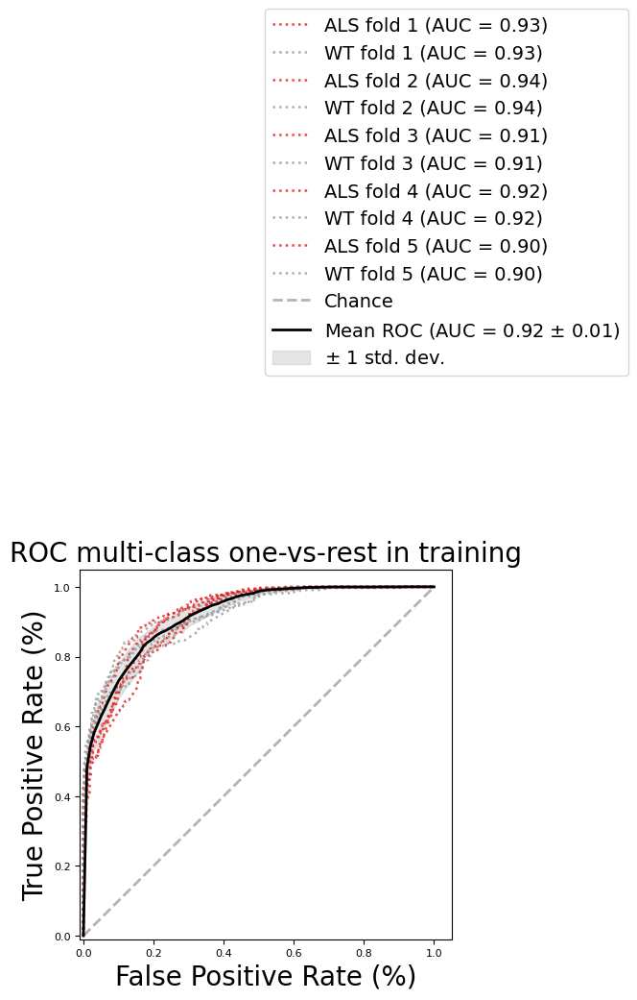



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.92600523 0.92600523 0.93682384 0.93682384 0.91004641 0.91004641
 0.91930058 0.91930058 0.90475669 0.90475669] Mean: 0.9193865481817289
'nHELDOUT SET - Classification Report: 
              precision    recall  f1-score   support

         ALS       0.77      0.92      0.84       482
          WT       0.88      0.68      0.77       416

    accuracy                           0.81       898
   macro avg       0.83      0.80      0.81       898
weighted avg       0.82      0.81      0.81       898

HELDOUT SET - Multilabel Confusion Matrix: 
[[[284 132]
  [ 37 445]]

 [[445  37]
  [132 284]]]
['ALS' 'WT']


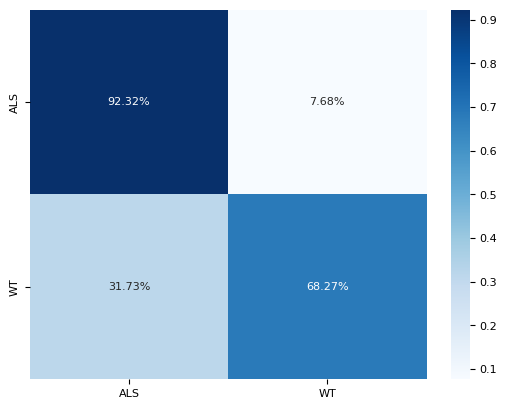

MLP
X_train shape (3588, 100), X_test shape: (898, 100), y_train shape: (3588,), y_test shape: (898,)
n_classes =  2, therefore using one hot encoder
(718, 2) (718, 2)
n_classes =  2, therefore using one hot encoder
(718, 2) (718, 2)
n_classes =  2, therefore using one hot encoder
(718, 2) (718, 2)
n_classes =  2, therefore using one hot encoder
(717, 2) (717, 2)
n_classes =  2, therefore using one hot encoder
(717, 2) (717, 2)


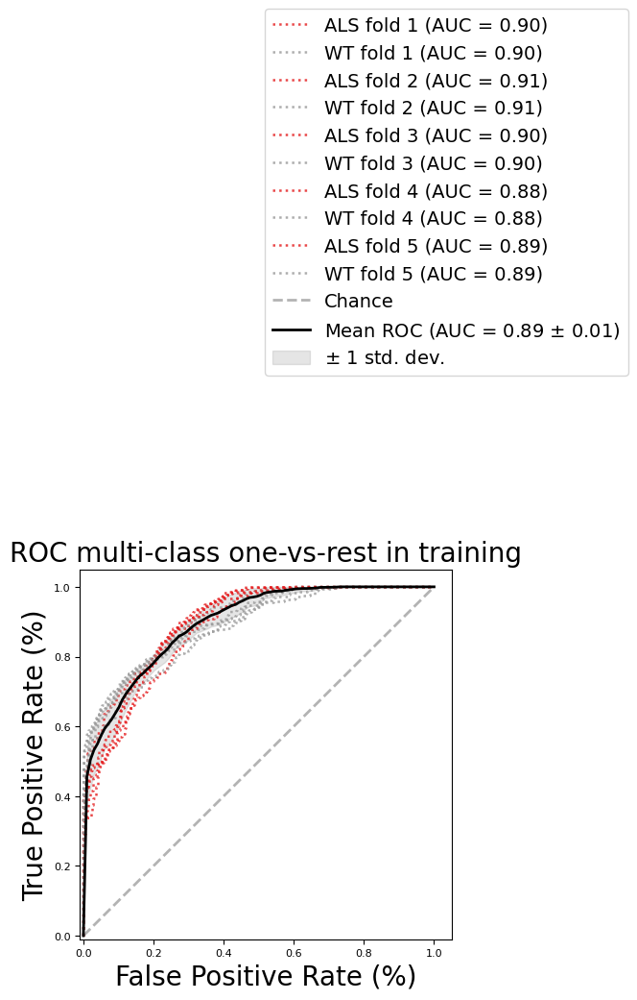



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.9030225  0.9030225  0.90921571 0.90921571 0.9006396  0.9006396
 0.87677985 0.87677985 0.89311532 0.89311532] Mean: 0.8965545955907401
'nHELDOUT SET - Classification Report: 
              precision    recall  f1-score   support

         ALS       0.79      0.86      0.82       482
          WT       0.82      0.73      0.77       416

    accuracy                           0.80       898
   macro avg       0.80      0.80      0.80       898
weighted avg       0.80      0.80      0.80       898

HELDOUT SET - Multilabel Confusion Matrix: 
[[[304 112]
  [ 67 415]]

 [[415  67]
  [112 304]]]
['ALS' 'WT']


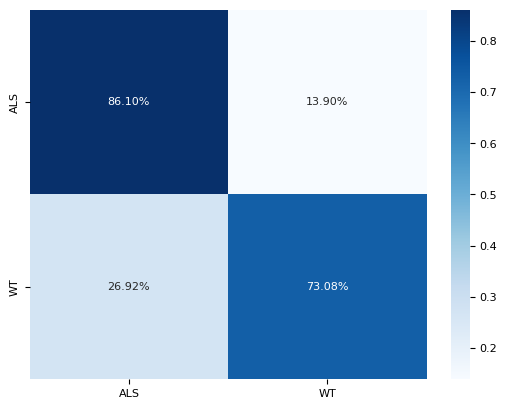

In [29]:
print("b4")
print("RFC")
fit_eval(rfc, X, y_binary.reshape(-1,))
print("MLP")
fit_eval(mlp, X, y_binary.reshape(-1,))

In [28]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(20,), activation='relu', random_state=1, learning_rate='adaptive', max_iter=300)
# mlp.fit(X_train, y_train)

from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(n_estimators=10, max_depth=3, random_state=1)

RFC
X_train shape (7642, 100), X_test shape: (1911, 100), y_train shape: (7642,), y_test shape: (1911,)
n_classes =  2, therefore using one hot encoder
(1529, 2) (1529, 2)
n_classes =  2, therefore using one hot encoder
(1529, 2) (1529, 2)
n_classes =  2, therefore using one hot encoder
(1528, 2) (1528, 2)
n_classes =  2, therefore using one hot encoder
(1528, 2) (1528, 2)
n_classes =  2, therefore using one hot encoder
(1528, 2) (1528, 2)


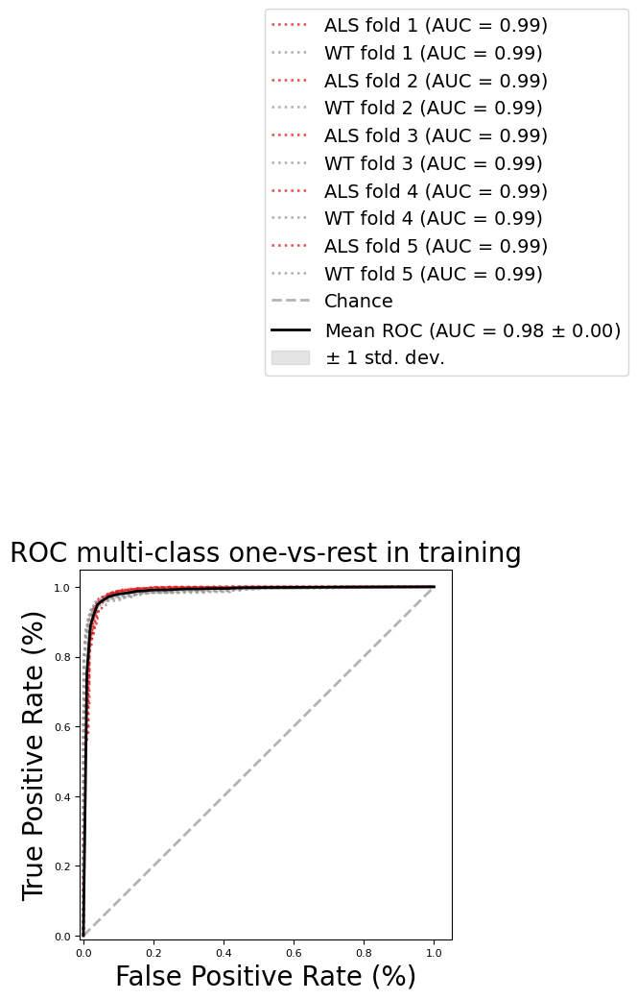



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.98610612 0.98610612 0.98681937 0.98681937 0.99109512 0.99109512
 0.98694857 0.98694857 0.98728645 0.98728645] Mean: 0.9876511258874521
'nHELDOUT SET - Classification Report: 
              precision    recall  f1-score   support

         ALS       0.95      0.99      0.97      1316
          WT       0.98      0.88      0.93       595

    accuracy                           0.96      1911
   macro avg       0.96      0.94      0.95      1911
weighted avg       0.96      0.96      0.96      1911

HELDOUT SET - Multilabel Confusion Matrix: 
[[[ 526   69]
  [  13 1303]]

 [[1303   13]
  [  69  526]]]
['ALS' 'WT']


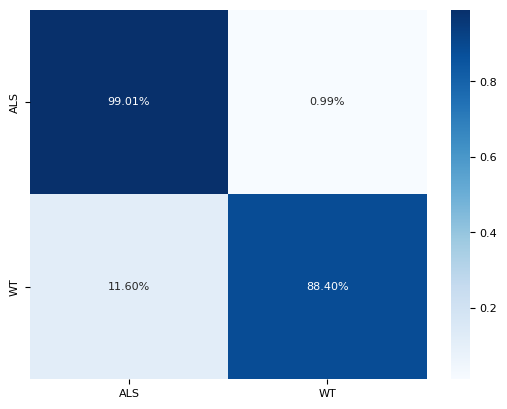

MLP
X_train shape (7642, 100), X_test shape: (1911, 100), y_train shape: (7642,), y_test shape: (1911,)
n_classes =  2, therefore using one hot encoder
(1529, 2) (1529, 2)
n_classes =  2, therefore using one hot encoder
(1529, 2) (1529, 2)
n_classes =  2, therefore using one hot encoder
(1528, 2) (1528, 2)
n_classes =  2, therefore using one hot encoder
(1528, 2) (1528, 2)
n_classes =  2, therefore using one hot encoder
(1528, 2) (1528, 2)


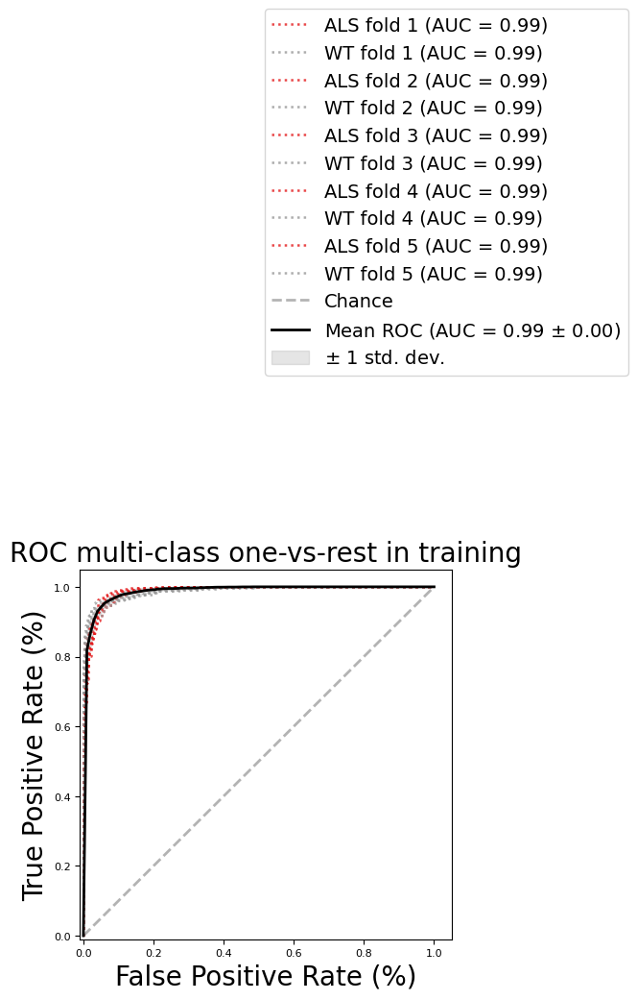



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.98838652 0.98838652 0.98653706 0.98653706 0.99274054 0.99274054
 0.98949768 0.98949768 0.98836007 0.98836007] Mean: 0.9891043756533952
'nHELDOUT SET - Classification Report: 
              precision    recall  f1-score   support

         ALS       0.96      0.97      0.97      1316
          WT       0.93      0.92      0.92       595

    accuracy                           0.95      1911
   macro avg       0.95      0.94      0.95      1911
weighted avg       0.95      0.95      0.95      1911

HELDOUT SET - Multilabel Confusion Matrix: 
[[[ 545   50]
  [  39 1277]]

 [[1277   39]
  [  50  545]]]
['ALS' 'WT']


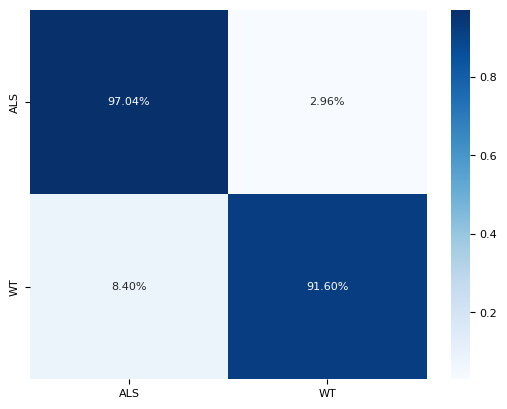

In [36]:
print("RFC")
fit_eval(rfc, X, y_binary.reshape(-1,))
print("MLP")
fit_eval(mlp, X, y_binary.reshape(-1,))

################## 2 UMAPS ##################
X_train shape (7642, 100), X_test shape: (1911, 100), y_train shape: (7642,), y_test shape: (1911,)
n_classes =  2, therefore using one hot encoder
(1529, 2) (1529, 2)
n_classes =  2, therefore using one hot encoder
(1529, 2) (1529, 2)
n_classes =  2, therefore using one hot encoder
(1528, 2) (1528, 2)
n_classes =  2, therefore using one hot encoder
(1528, 2) (1528, 2)
n_classes =  2, therefore using one hot encoder
(1528, 2) (1528, 2)


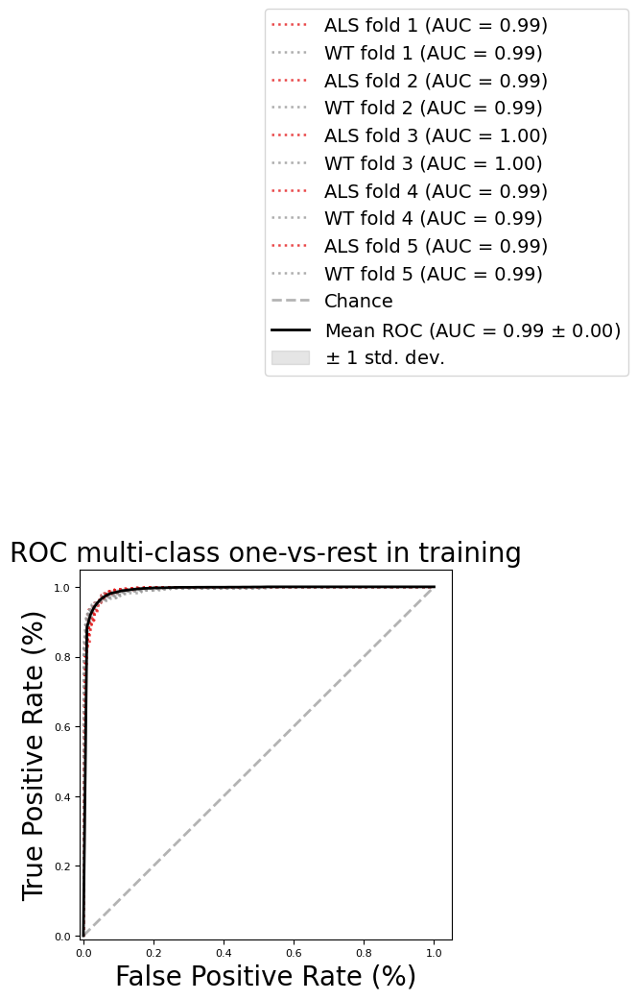



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.99267798 0.99267798 0.99296528 0.99296528 0.99512171 0.99512171
 0.99324836 0.99324836 0.9922907  0.9922907 ] Mean: 0.9932608057768016
'nHELDOUT SET - Classification Report: 
              precision    recall  f1-score   support

         ALS       0.96      0.98      0.97      1316
          WT       0.96      0.91      0.94       595

    accuracy                           0.96      1911
   macro avg       0.96      0.95      0.95      1911
weighted avg       0.96      0.96      0.96      1911

HELDOUT SET - Multilabel Confusion Matrix: 
[[[ 542   53]
  [  22 1294]]

 [[1294   22]
  [  53  542]]]
['ALS' 'WT']


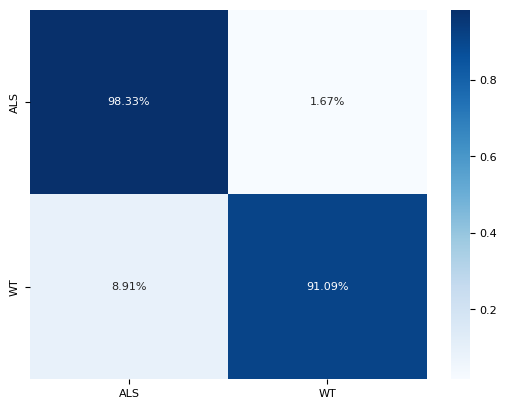

In [33]:
# X100 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/features/sm_embeddings_batch9_16bit_no_downsample_vqvec2_UMAP100.npy")



svc = SVC(kernel='rbf', random_state=1, probability=True)
fit_eval(svc, X, y_binary.reshape(-1,))

# print("################## 100 UMAPS ##################") # Might be worse since SVC isn't strong enough for 100 features?
# svc = SVC(kernel='rbf', random_state=1, probability=True)
# fit_eval(svc, X100, y_binary)

# print("!!!! MLP !!!")
# fit_eval(mlp, X100, y_binary)


# Multiclass

### Models

In [23]:
from sklearn.svm import SVC


svc = SVC(kernel='rbf', random_state=1, probability=True)

X_train shape (3588, 100), X_test shape: (898, 100), y_train shape: (3588,), y_test shape: (898,)
Using label binarize
(718, 9) (718, 9)
Using label binarize
(718, 9) (718, 9)
Using label binarize
(718, 9) (718, 9)
Using label binarize
(717, 9) (717, 9)
Using label binarize
(717, 9) (717, 9)


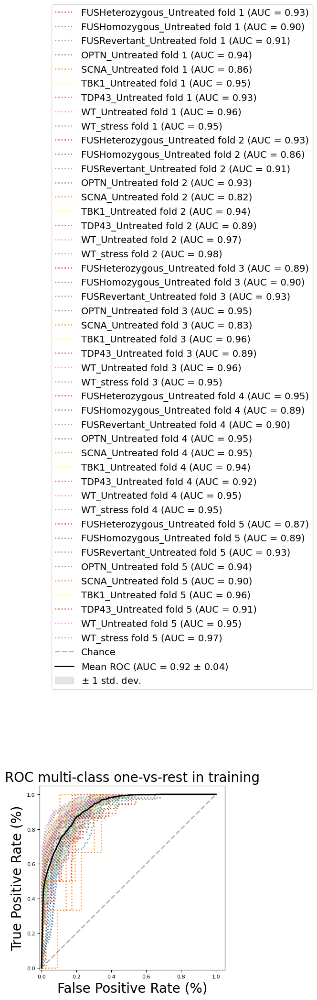



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.92975352 0.90392124 0.91233178 0.94164427 0.85920746 0.94908765
 0.9308251  0.96096195 0.95290118 0.93415493 0.85558902 0.91414337
 0.93373656 0.81585082 0.94415934 0.89058221 0.96884781 0.97551297
 0.88820423 0.89680946 0.93138219 0.95194699 0.82517483 0.95717932
 0.88673255 0.96288146 0.95425619 0.94534556 0.89366516 0.90247698
 0.95201867 0.94545455 0.93840777 0.92249603 0.95466013 0.95226149
 0.8711213  0.8930786  0.92816767 0.94278758 0.9        0.96390687
 0.9059221  0.95172076 0.96581103] Mean: 0.9234906802353079
Validating - Validate classifier

------------------

Balanced accuracy score: 0.4415027150297214. 
Balanced accuracy score (adjusted): 0.37169055440843657


One-vs-One ROC AUC scores:
0.915076 (macro),
0.934105 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.935874 (macro),
0.950066 (weighted by prevalence)


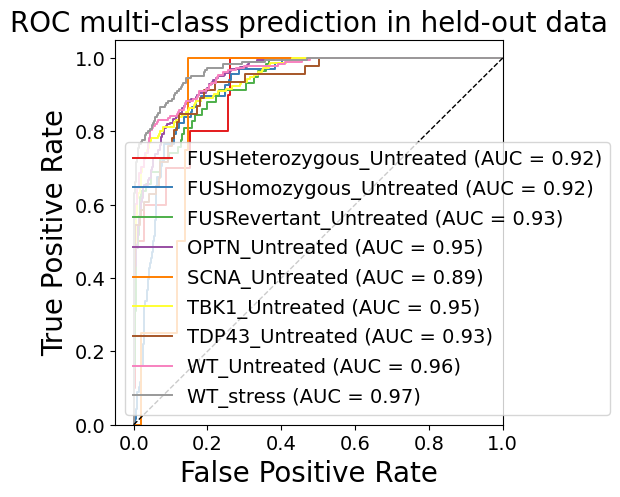

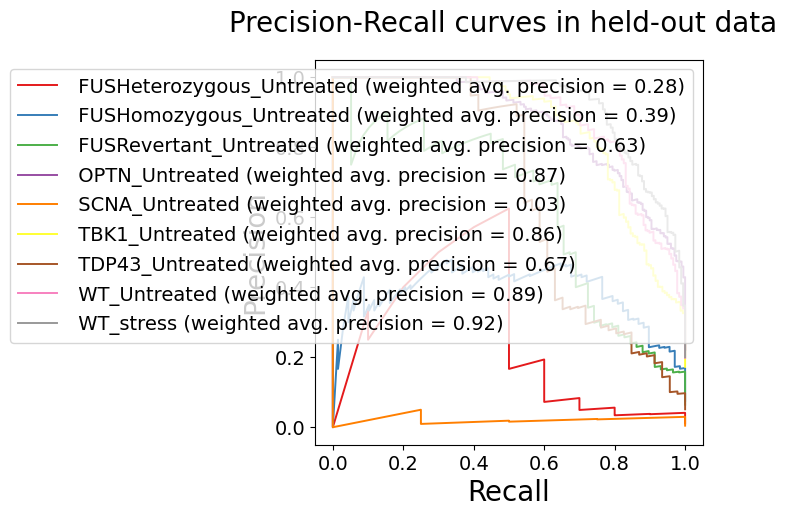

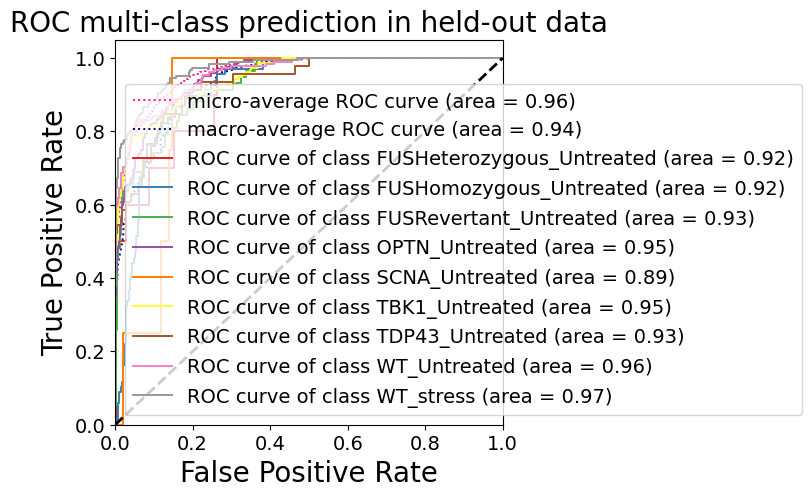


HELDOUT SET - AUC ROC scores of each class: {0: 0.9199324324324324, 1: 0.9194365698086464, 2: 0.9315065681444991, 3: 0.9504820238531715, 4: 0.8940156599552572, 5: 0.9469543698172188, 6: 0.9333792610736885, 7: 0.9565621098626715, 8: 0.9705973382853605, 'micro': 0.9612247707104629, 'macro': 0.9362781024143141}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.00      0.00      0.00        10
  FUSHomozygous_Untreated       0.38      0.47      0.42        68
   FUSRevertant_Untreated       1.00      0.03      0.07        58
           OPTN_Untreated       0.58      0.88      0.70       199
           SCNA_Untreated       0.00      0.00      0.00         4
           TBK1_Untreated       0.85      0.71      0.77       155
          TDP43_Untreated       1.00      0.30      0.47        46
             WT_Untreated       0.83      0.75      0.79       178
                WT_stress       0.73      0.8

/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter t

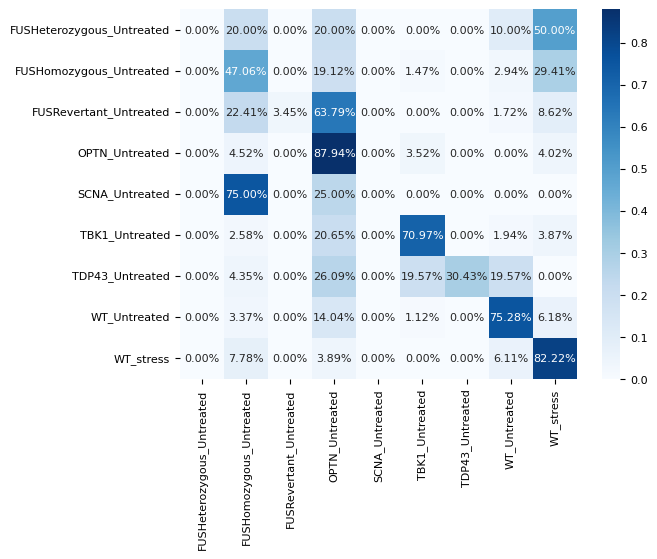


HELDOUT SET - One-vs-rest Confusion Matrix:
[[  0   2   0   2   0   0   0   1   5]
 [  0  32   0  13   0   1   0   2  20]
 [  0  13   2  37   0   0   0   1   5]
 [  0   9   0 175   0   7   0   0   8]
 [  0   3   0   1   0   0   0   0   0]
 [  0   4   0  32   0 110   0   3   6]
 [  0   2   0  12   0   9  14   9   0]
 [  0   6   0  25   0   2   0 134  11]
 [  0  14   0   7   0   0   0  11 148]]
Sensitivity, hit rate, recall, or true positive rate: [0.         0.47058824 0.03448276 0.87939698 0.         0.70967742
 0.30434783 0.75280899 0.82222222]
Specificity or true negative rate: [1.         0.93614458 1.         0.81545064 1.         0.97442799
 1.         0.9625     0.92339833]
Precision or positive predictive value: [       nan 0.37647059 1.         0.57565789        nan 0.85271318
 1.         0.83229814 0.72906404]
Negative predictive value: [0.98886414 0.95571956 0.9375     0.95959596 0.99554566 0.94148244
 0.9638009  0.94029851 0.95395683]
Fall out or false positive rate: [0.   

/tmp/ipykernel_230495/846425149.py:208: RuntimeWarning: invalid value encountered in divide
  PPV = TP / (TP + FP)
/tmp/ipykernel_230495/846425149.py:220: RuntimeWarning: invalid value encountered in divide
  FDR = FP / (TP + FP)


Performance score roc_auc_ovr_weighted on the held-out test-set (25%): 0.6848552338530067


In [24]:
print("b4")
fit_eval(svc, X, y)

In [30]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(50,), activation='relu', random_state=1)


b4
MLPClassifier(hidden_layer_sizes=(50,), random_state=1)
X_train shape (3588, 100), X_test shape: (898, 100), y_train shape: (3588,), y_test shape: (898,)


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Using label binarize
(718, 9) (718, 9)


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Using label binarize
(718, 9) (718, 9)


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:698: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")


Using label binarize
(718, 9) (718, 9)


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Using label binarize
(717, 9) (717, 9)


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Using label binarize
(717, 9) (717, 9)


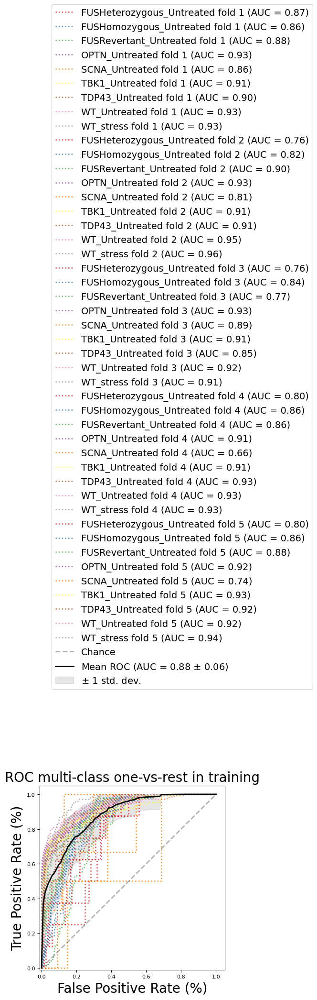



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.8681338  0.86392793 0.88476967 0.9265345  0.86013986 0.91017704
 0.89982934 0.92830595 0.92939412 0.7596831  0.82201026 0.90058877
 0.93132841 0.81165501 0.90588683 0.90848117 0.94514133 0.96169667
 0.7568662  0.83514614 0.77204553 0.92509085 0.88857809 0.90690507
 0.84863277 0.91549296 0.91265002 0.79795487 0.86338752 0.8649095
 0.90845563 0.65524476 0.90771365 0.93096184 0.92816901 0.93385205
 0.79795487 0.86472823 0.88180375 0.9220261  0.73706294 0.92824893
 0.92193959 0.92327006 0.9352579 ] Mean: 0.8773785012248131


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Validating - Validate classifier

------------------

Balanced accuracy score: 0.3781470288002283. 
Balanced accuracy score (adjusted): 0.3004154074002569


One-vs-One ROC AUC scores:
0.875658 (macro),
0.909604 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.915782 (macro),
0.931087 (weighted by prevalence)


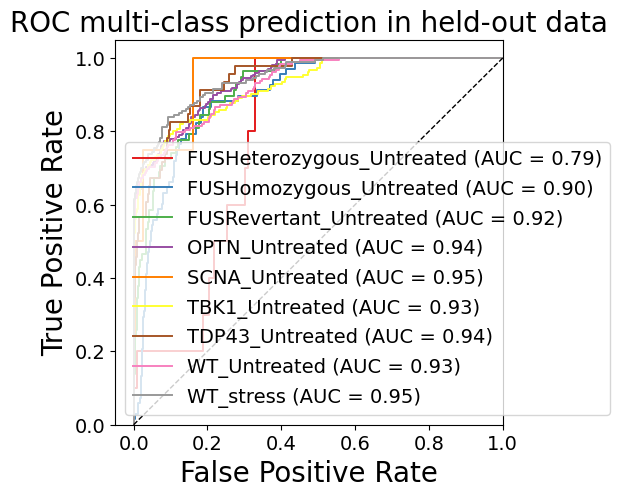

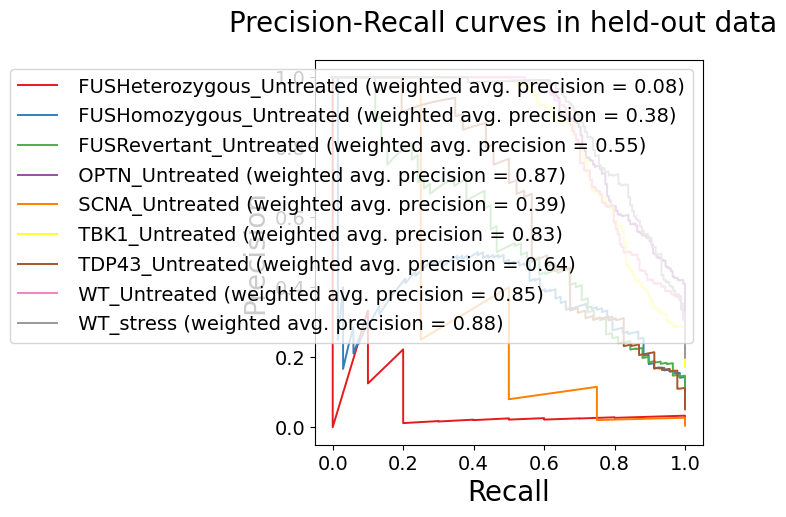

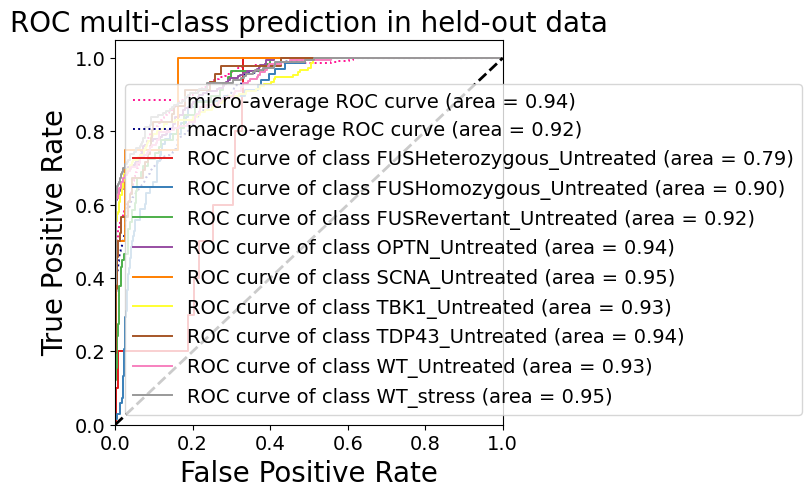


HELDOUT SET - AUC ROC scores of each class: {0: 0.7856981981981982, 1: 0.8986888731396173, 2: 0.922146962233169, 3: 0.9404677177015262, 4: 0.9524608501118568, 5: 0.9252203360395953, 6: 0.9400898142478057, 7: 0.9298064918851435, 8: 0.9474543484989166, 'micro': 0.9409377929672966, 'macro': 0.9161776342833099}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.00      0.00      0.00        10
  FUSHomozygous_Untreated       0.35      0.25      0.29        68
   FUSRevertant_Untreated       0.00      0.00      0.00        58
           OPTN_Untreated       0.58      0.86      0.69       199
           SCNA_Untreated       0.00      0.00      0.00         4
           TBK1_Untreated       0.72      0.74      0.73       155
          TDP43_Untreated       0.00      0.00      0.00        46
             WT_Untreated       0.76      0.74      0.75       178
                WT_stress       0.67      0.81

/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter t

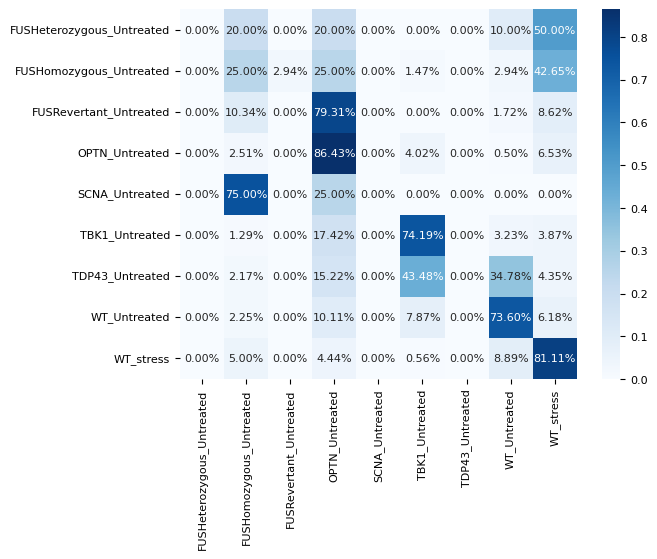


HELDOUT SET - One-vs-rest Confusion Matrix:
[[  0   2   0   2   0   0   0   1   5]
 [  0  17   2  17   0   1   0   2  29]
 [  0   6   0  46   0   0   0   1   5]
 [  0   5   0 172   0   8   0   1  13]
 [  0   3   0   1   0   0   0   0   0]
 [  0   2   0  27   0 115   0   5   6]
 [  0   1   0   7   0  20   0  16   2]
 [  0   4   0  18   0  14   0 131  11]
 [  0   9   0   8   0   1   0  16 146]]
Sensitivity, hit rate, recall, or true positive rate: [0.         0.25       0.         0.86432161 0.         0.74193548
 0.         0.73595506 0.81111111]
Specificity or true negative rate: [1.         0.96144578 0.99761905 0.81974249 1.         0.94078062
 1.         0.94166667 0.90111421]
Precision or positive predictive value: [       nan 0.34693878 0.         0.57718121        nan 0.72327044
        nan 0.75722543 0.67281106]
Negative predictive value: [0.98886414 0.93992933 0.93526786 0.955      0.99554566 0.9458728
 0.94877506 0.93517241 0.95007342]
Fall out or false positive rate: [0.    

/tmp/ipykernel_230495/846425149.py:208: RuntimeWarning: invalid value encountered in divide
  PPV = TP / (TP + FP)
/tmp/ipykernel_230495/846425149.py:220: RuntimeWarning: invalid value encountered in divide
  FDR = FP / (TP + FP)


In [31]:
print("b4")
print(mlp)
fit_eval(mlp, X, y)

b4
RandomForestClassifier(max_depth=3, n_estimators=10, random_state=1)
X_train shape (3588, 100), X_test shape: (898, 100), y_train shape: (3588,), y_test shape: (898,)
Using label binarize
(718, 9) (718, 9)
Using label binarize
(718, 9) (718, 9)
Using label binarize
(718, 9) (718, 9)
Using label binarize
(717, 9) (717, 9)
Using label binarize
(717, 9) (717, 9)


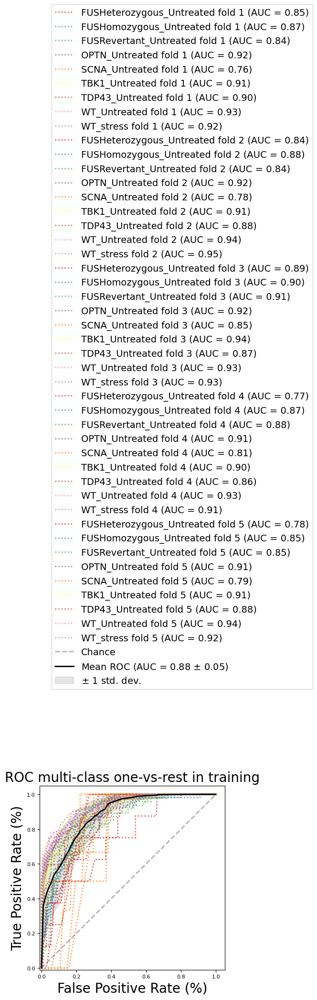



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.84709507 0.8654479  0.8440088  0.92488799 0.75710956 0.90572391
 0.90332182 0.93008485 0.92441565 0.84322183 0.8800898  0.84384705
 0.91751232 0.77762238 0.90786222 0.87841807 0.94385759 0.94670078
 0.8881162  0.90082552 0.91081904 0.91724328 0.84965035 0.94308678
 0.87226654 0.92685715 0.92985385 0.77468265 0.86780068 0.87945379
 0.9125696  0.81083916 0.90074389 0.85558426 0.92819351 0.90775281
 0.77547602 0.8516703  0.85241346 0.90990397 0.79160839 0.90892401
 0.87897456 0.93664421 0.92487153] Mean: 0.8810678474807231
Validating - Validate classifier

------------------

Balanced accuracy score: 0.3561397714824755. 
Balanced accuracy score (adjusted): 0.275657242917785


One-vs-One ROC AUC scores:
0.881382 (macro),
0.903521 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.915289 (macro),
0.923390 (weighted by prevalence)


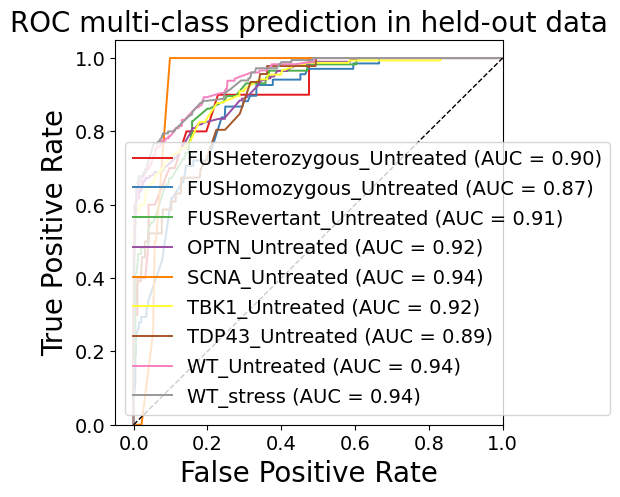

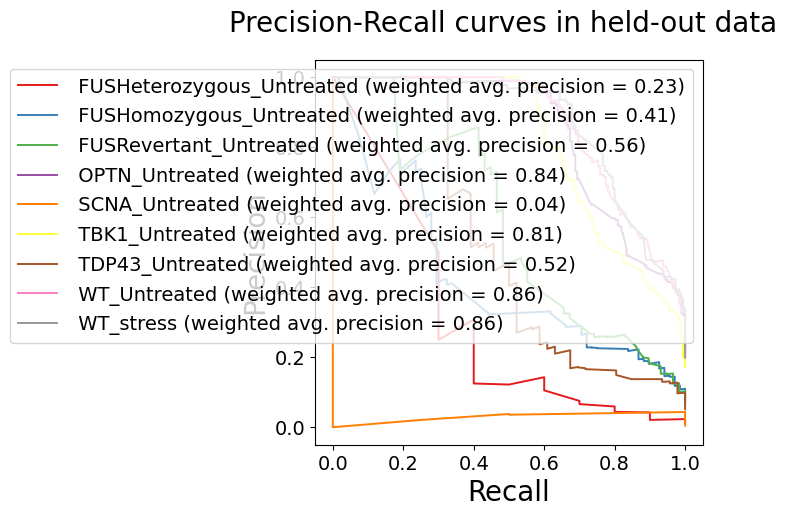

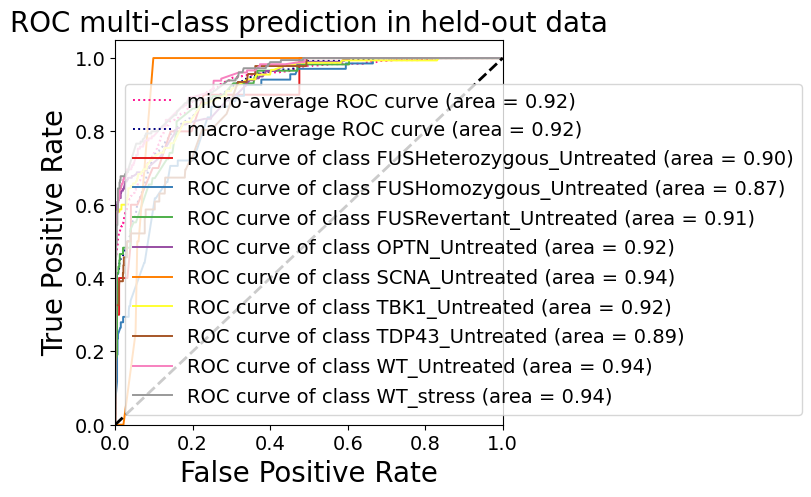


HELDOUT SET - AUC ROC scores of each class: {0: 0.9015765765765765, 1: 0.8720056697377746, 2: 0.9091748768472906, 3: 0.9200508982681649, 4: 0.9373601789709173, 5: 0.9208222984413666, 6: 0.8903857930189836, 7: 0.943188202247191, 8: 0.9430400804704426, 'micro': 0.9247325162077569, 'macro': 0.9153434228448518}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.00      0.00      0.00        10
  FUSHomozygous_Untreated       0.64      0.10      0.18        68
   FUSRevertant_Untreated       0.00      0.00      0.00        58
           OPTN_Untreated       0.50      0.87      0.64       199
           SCNA_Untreated       0.00      0.00      0.00         4
           TBK1_Untreated       0.71      0.70      0.71       155
          TDP43_Untreated       0.00      0.00      0.00        46
             WT_Untreated       0.79      0.72      0.76       178
                WT_stress       0.65      0.80

/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter t

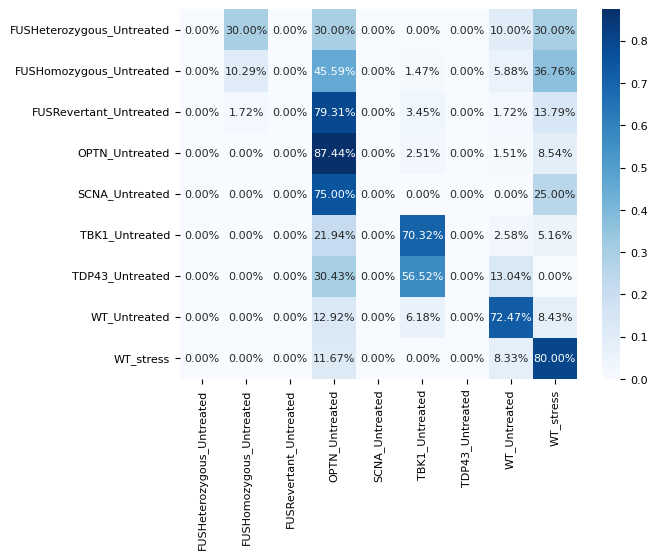


HELDOUT SET - One-vs-rest Confusion Matrix:
[[  0   3   0   3   0   0   0   1   3]
 [  0   7   0  31   0   1   0   4  25]
 [  0   1   0  46   0   2   0   1   8]
 [  0   0   0 174   0   5   0   3  17]
 [  0   0   0   3   0   0   0   0   1]
 [  0   0   0  34   0 109   0   4   8]
 [  0   0   0  14   0  26   0   6   0]
 [  0   0   0  23   0  11   0 129  15]
 [  0   0   0  21   0   0   0  15 144]]
Sensitivity, hit rate, recall, or true positive rate: [0.         0.10294118 0.         0.87437186 0.         0.70322581
 0.         0.7247191  0.8       ]
Specificity or true negative rate: [1.         0.99518072 1.         0.74964235 1.         0.93943472
 1.         0.95277778 0.89275766]
Precision or positive predictive value: [       nan 0.63636364        nan 0.49856734        nan 0.70779221
        nan 0.79141104 0.65158371]
Negative predictive value: [0.98886414 0.93122886 0.93541203 0.95446266 0.99554566 0.93817204
 0.94877506 0.93333333 0.94682422]
Fall out or false positive rate: [0.   

/tmp/ipykernel_230495/846425149.py:208: RuntimeWarning: invalid value encountered in divide
  PPV = TP / (TP + FP)
/tmp/ipykernel_230495/846425149.py:220: RuntimeWarning: invalid value encountered in divide
  FDR = FP / (TP + FP)


In [33]:
rfc = RandomForestClassifier(n_estimators=10, max_depth=3, random_state=1)

print("b4")
print(rfc)
fit_eval(rfc, X, y)

b4
KNeighborsClassifier()
X_train shape (3588, 100), X_test shape: (898, 100), y_train shape: (3588,), y_test shape: (898,)
Using label binarize
(718, 9) (718, 9)
Using label binarize
(718, 9) (718, 9)
Using label binarize
(718, 9) (718, 9)
Using label binarize
(717, 9) (717, 9)
Using label binarize
(717, 9) (717, 9)


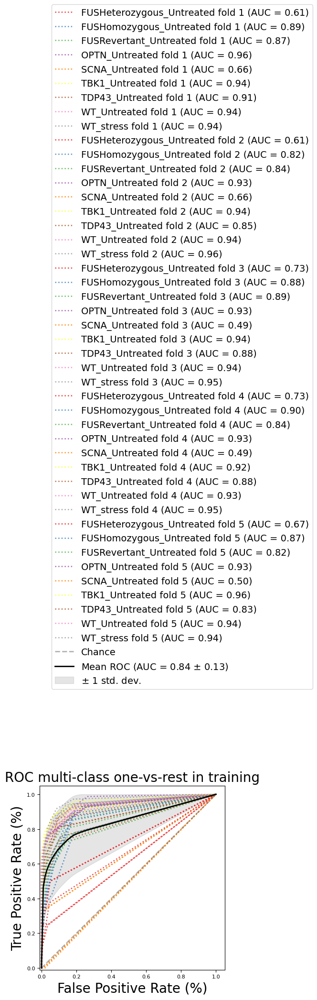



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.60933099 0.89492693 0.8657641  0.96048947 0.65897436 0.9388916
 0.9099496  0.93720657 0.94311363 0.6084507  0.82104808 0.83914014
 0.92682572 0.66037296 0.94016781 0.85168869 0.94073993 0.96319081
 0.72922535 0.88158188 0.89347433 0.92885994 0.49440559 0.93901379
 0.88129539 0.94377201 0.94617451 0.73025388 0.89778504 0.8426167
 0.93412006 0.49020979 0.91736931 0.88298887 0.92666871 0.94889228
 0.6666079  0.86801017 0.82027628 0.92790965 0.4958042  0.95877305
 0.83398251 0.93605021 0.94440203] Mean: 0.8429065673244536
Validating - Validate classifier

------------------

Balanced accuracy score: 0.6214479960812354. 
Balanced accuracy score (adjusted): 0.5741289955913897


One-vs-One ROC AUC scores:
0.888635 (macro),
0.910240 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.900481 (macro),
0.931285 (weighted by prevalence)


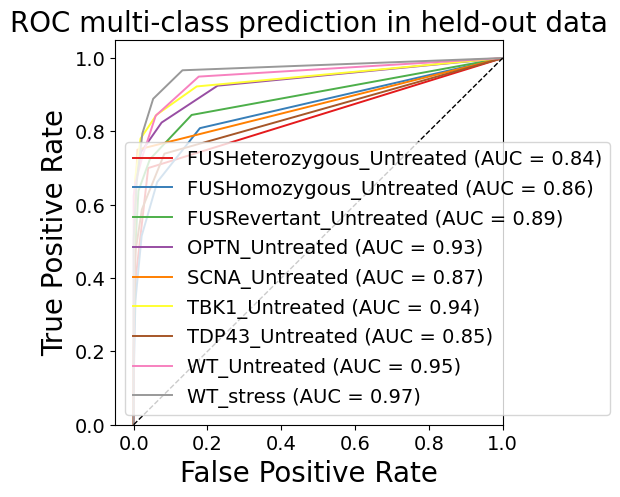

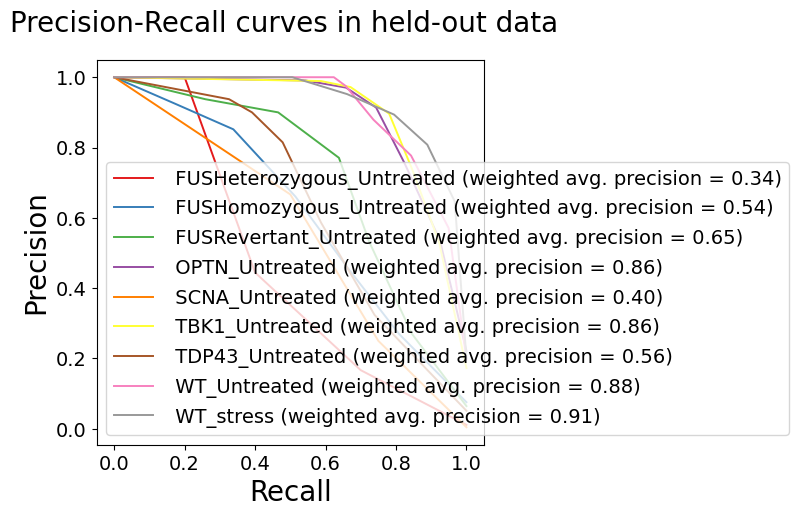

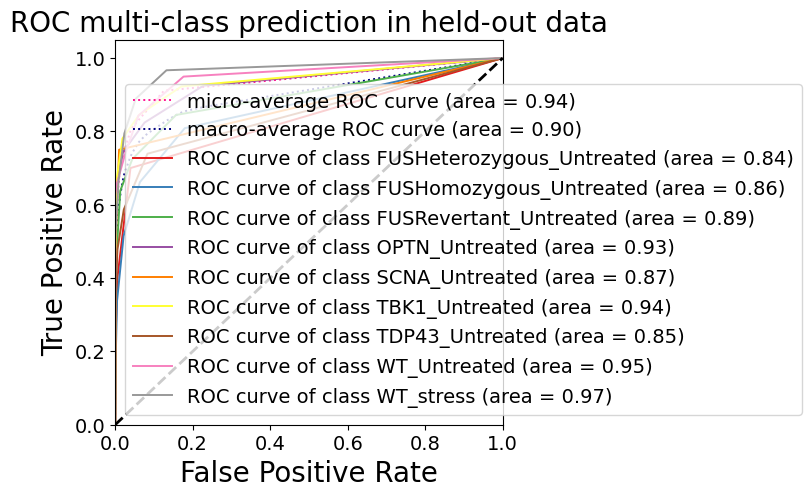


HELDOUT SET - AUC ROC scores of each class: {0: 0.836768018018018, 1: 0.8601346562721475, 2: 0.8935344827586207, 3: 0.932743114715207, 4: 0.8720637583892616, 5: 0.9411800460209265, 6: 0.8484639722392324, 7: 0.9519194756554307, 8: 0.9675216651191583, 'micro': 0.9372558605860091, 'macro': 0.9004810210208891}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.43      0.30      0.35        10
  FUSHomozygous_Untreated       0.44      0.68      0.53        68
   FUSRevertant_Untreated       0.60      0.67      0.63        58
           OPTN_Untreated       0.81      0.78      0.79       199
           SCNA_Untreated       1.00      0.25      0.40         4
           TBK1_Untreated       0.80      0.81      0.80       155
          TDP43_Untreated       0.70      0.50      0.58        46
             WT_Untreated       0.83      0.79      0.81       178
                WT_stress       0.86      0.82 

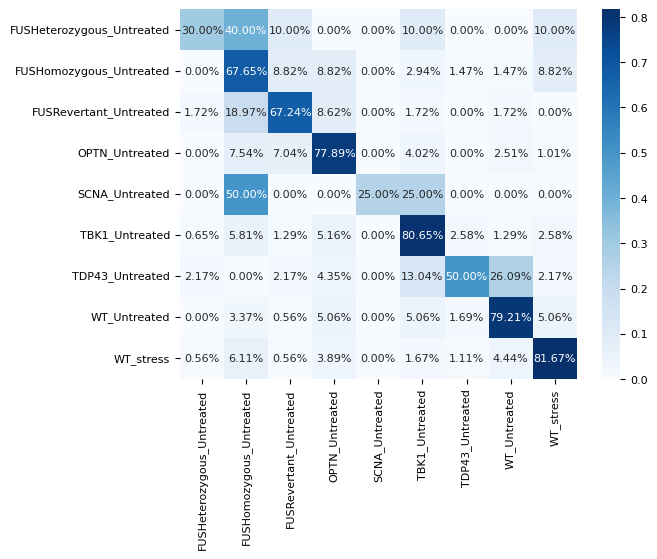


HELDOUT SET - One-vs-rest Confusion Matrix:
[[  3   4   1   0   0   1   0   0   1]
 [  0  46   6   6   0   2   1   1   6]
 [  1  11  39   5   0   1   0   1   0]
 [  0  15  14 155   0   8   0   5   2]
 [  0   2   0   0   1   1   0   0   0]
 [  1   9   2   8   0 125   4   2   4]
 [  1   0   1   2   0   6  23  12   1]
 [  0   6   1   9   0   9   3 141   9]
 [  1  11   1   7   0   3   2   8 147]]
Sensitivity, hit rate, recall, or true positive rate: [0.3        0.67647059 0.67241379 0.77889447 0.25       0.80645161
 0.5        0.79213483 0.81666667]
Specificity or true negative rate: [0.9954955  0.93012048 0.96904762 0.94706724 1.         0.95827725
 0.98826291 0.95972222 0.96796657]
Precision or positive predictive value: [0.42857143 0.44230769 0.6        0.80729167 1.         0.80128205
 0.6969697  0.82941176 0.86470588]
Negative predictive value: [0.99214366 0.97229219 0.97719088 0.93767705 0.99665552 0.95956873
 0.9734104  0.94917582 0.95467033]
Fall out or false positive rate: [0.004

In [32]:
from sklearn.neighbors import KNeighborsClassifier

knc = KNeighborsClassifier()
print("b4")
print(knc)
fit_eval(knc, X, y)

b4
X_train shape (3588, 100), X_test shape: (898, 100), y_train shape: (3588,), y_test shape: (898,)


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Using label binarize
(718, 9) (718, 9)


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Using label binarize
(718, 9) (718, 9)


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Using label binarize
(718, 9) (718, 9)


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Using label binarize
(717, 9) (717, 9)


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Using label binarize
(717, 9) (717, 9)


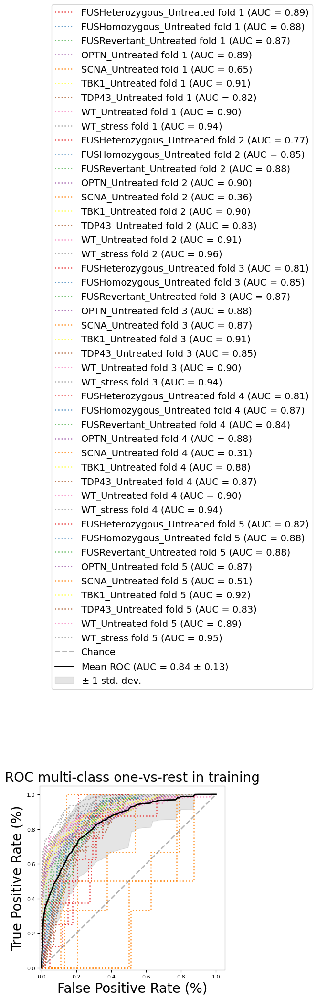



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.89066901 0.87904395 0.87014752 0.89081541 0.65221445 0.90501792
 0.81561297 0.89944004 0.94083914 0.7681338  0.847529   0.88282867
 0.90395385 0.35804196 0.89676333 0.82696353 0.9108348  0.96386227
 0.80897887 0.85003905 0.8672036  0.88009811 0.87365967 0.91463017
 0.85244275 0.9043305  0.94152875 0.81258815 0.87106866 0.83604319
 0.88434661 0.31188811 0.87988903 0.86613672 0.90169014 0.93614262
 0.8221086  0.87785599 0.88243887 0.87239918 0.51118881 0.91906925
 0.82547695 0.88650337 0.9468441 ] Mean: 0.840873365799482


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Validating - Validate classifier

------------------

Balanced accuracy score: 0.34968500083191867. 
Balanced accuracy score (adjusted): 0.26839562593590854


One-vs-One ROC AUC scores:
0.831594 (macro),
0.880452 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.874716 (macro),
0.916727 (weighted by prevalence)


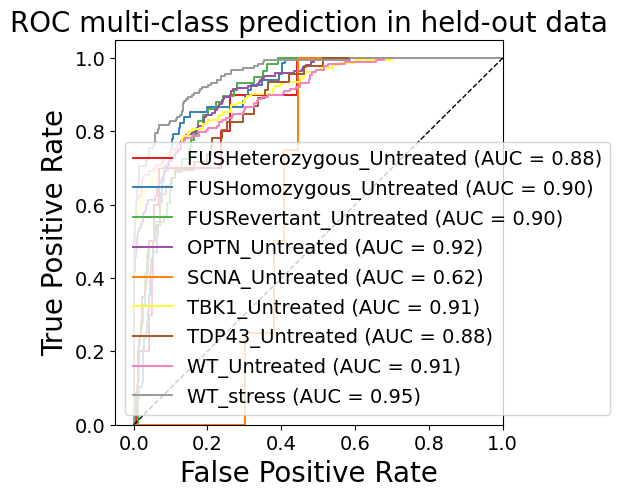

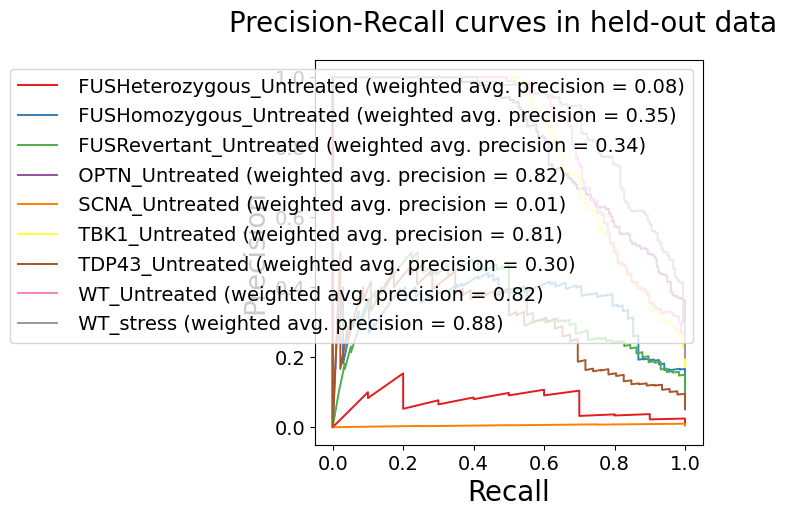

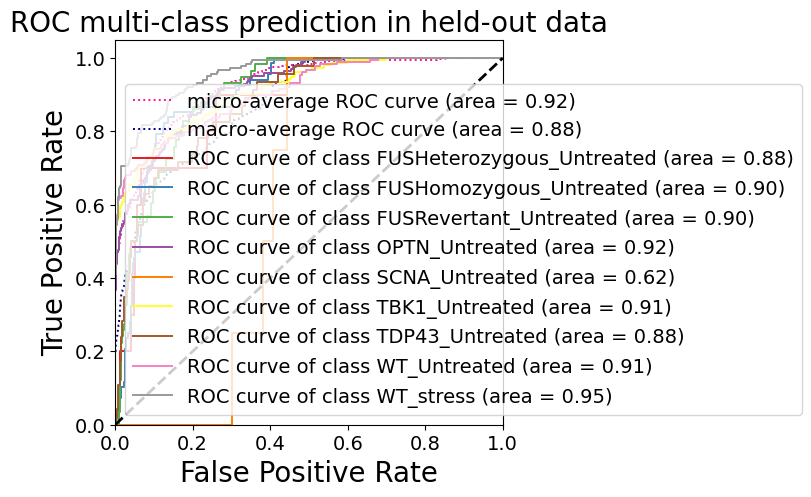


HELDOUT SET - AUC ROC scores of each class: {0: 0.8773648648648649, 1: 0.9019666902905741, 2: 0.902196223316913, 3: 0.9190588133802057, 4: 0.6166107382550335, 5: 0.9130291321147918, 6: 0.8796693202694428, 7: 0.907748127340824, 8: 0.9547972763850201, 'micro': 0.9239639808334285, 'macro': 0.8752499204849105}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.00      0.00      0.00        10
  FUSHomozygous_Untreated       0.22      0.07      0.11        68
   FUSRevertant_Untreated       0.00      0.00      0.00        58
           OPTN_Untreated       0.49      0.93      0.64       199
           SCNA_Untreated       0.00      0.00      0.00         4
           TBK1_Untreated       0.68      0.70      0.69       155
          TDP43_Untreated       0.00      0.00      0.00        46
             WT_Untreated       0.82      0.67      0.74       178
                WT_stress       0.77      0.77 

/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter t

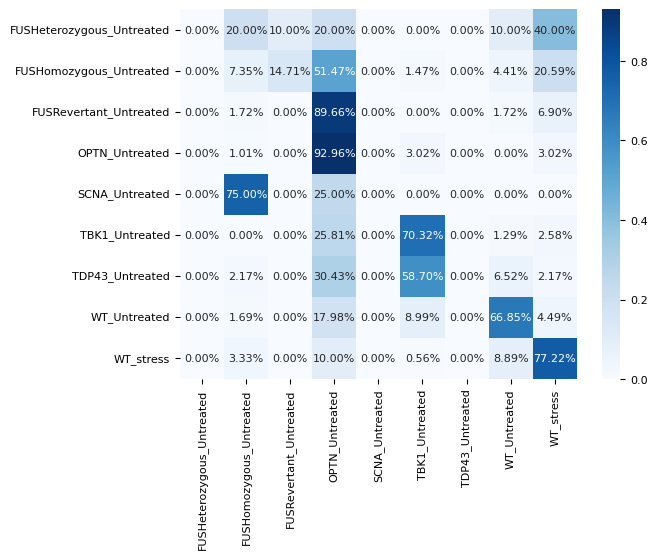


HELDOUT SET - One-vs-rest Confusion Matrix:
[[  0   2   1   2   0   0   0   1   4]
 [  0   5  10  35   0   1   0   3  14]
 [  0   1   0  52   0   0   0   1   4]
 [  0   2   0 185   0   6   0   0   6]
 [  0   3   0   1   0   0   0   0   0]
 [  0   0   0  40   0 109   0   2   4]
 [  0   1   0  14   0  27   0   3   1]
 [  0   3   0  32   0  16   0 119   8]
 [  0   6   0  18   0   1   0  16 139]]
Sensitivity, hit rate, recall, or true positive rate: [0.         0.07352941 0.         0.92964824 0.         0.70322581
 0.         0.66853933 0.77222222]
Specificity or true negative rate: [1.         0.97831325 0.98690476 0.72246066 1.         0.93135935
 1.         0.96388889 0.94289694]
Precision or positive predictive value: [       nan 0.2173913  0.         0.48812665        nan 0.68125
        nan 0.82068966 0.77222222]
Negative predictive value: [0.98886414 0.928      0.93461105 0.97302505 0.99554566 0.93766938
 0.94877506 0.92164675 0.94289694]
Fall out or false positive rate: [0.      

/tmp/ipykernel_230495/846425149.py:208: RuntimeWarning: invalid value encountered in divide
  PPV = TP / (TP + FP)
/tmp/ipykernel_230495/846425149.py:220: RuntimeWarning: invalid value encountered in divide
  FDR = FP / (TP + FP)


In [26]:
print("b4")
fit_eval(mlp, X, y)

X_train shape (7642, 2), X_test shape: (1911, 2), y_train shape: (7642,), y_test shape: (1911,)
Using label binarize
(1529, 9) (1529, 9)
Using label binarize
(1529, 9) (1529, 9)
Using label binarize
(1528, 9) (1528, 9)
Using label binarize
(1528, 9) (1528, 9)
Using label binarize
(1528, 9) (1528, 9)


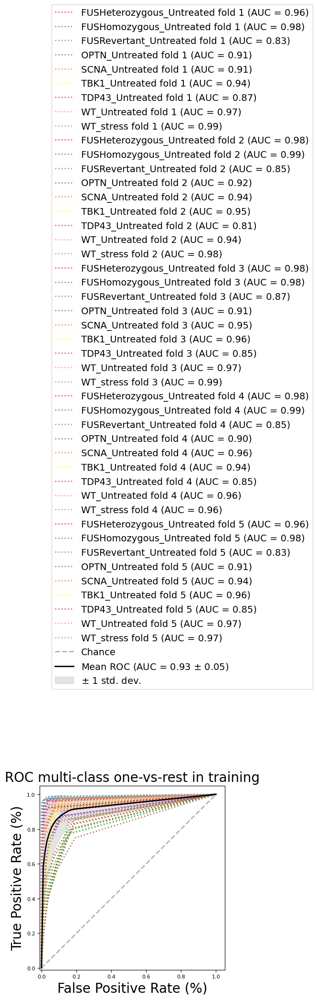



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.95730542 0.98252698 0.83180317 0.90606129 0.90611072 0.94053171
 0.87315349 0.97137261 0.98851401 0.97712654 0.99027849 0.84683897
 0.91961646 0.9388928  0.94920289 0.80865875 0.93700622 0.98437926
 0.97915979 0.98294336 0.87172915 0.90797467 0.94843894 0.9552264
 0.84769567 0.97077281 0.98537853 0.98074937 0.9882197  0.84585317
 0.89806971 0.9562523  0.93597604 0.85058309 0.96411366 0.95634885
 0.95555088 0.98000441 0.83105631 0.90688894 0.94422678 0.95696828
 0.85221135 0.97316511 0.96756081] Mean: 0.9311666192327652
Validating - Validate classifier

------------------

Balanced accuracy score: 0.758548842349188. 
Balanced accuracy score (adjusted): 0.7283674476428365


One-vs-One ROC AUC scores:
0.927851 (macro),
0.931703 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.929070 (macro),
0.937049 (weighted by prevalence)


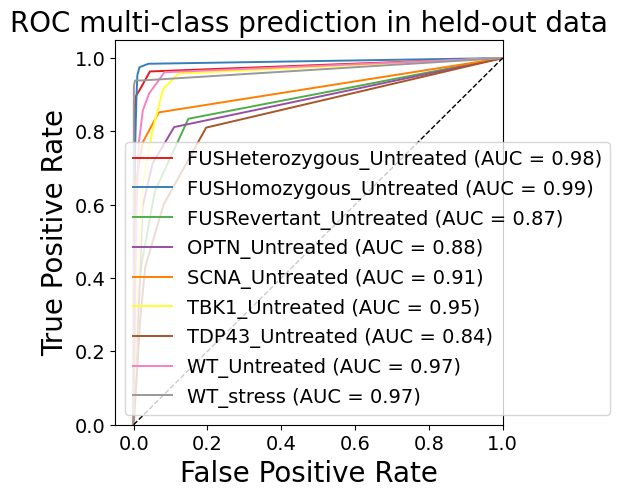

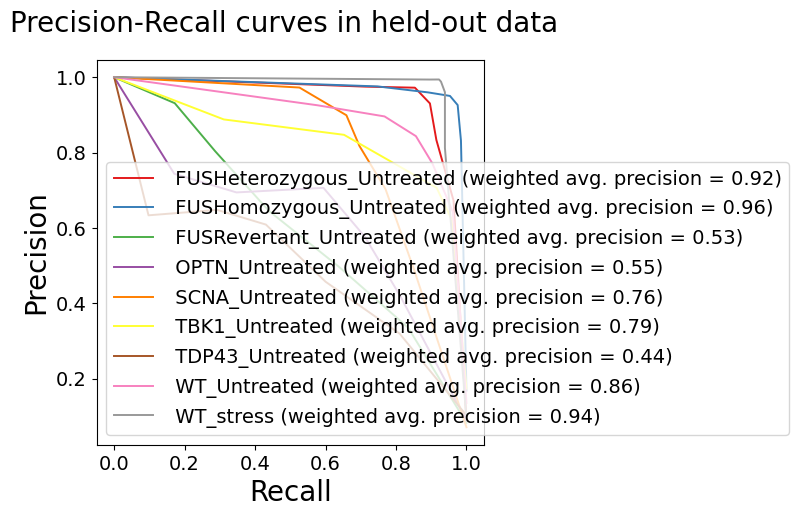

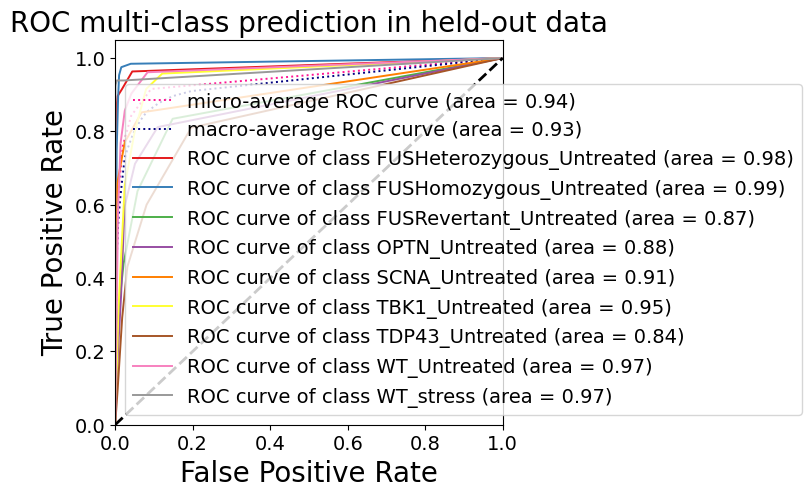


HELDOUT SET - AUC ROC scores of each class: {0: 0.9781157943233697, 1: 0.9885851995532828, 2: 0.8741221157826696, 3: 0.8759502652295841, 4: 0.9146688355021688, 5: 0.9520689127691309, 6: 0.8416920686151455, 7: 0.9679816354572611, 8: 0.9684479106489504, 'micro': 0.9427889801011577, 'macro': 0.9290711957225671}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.92      0.90      0.91       164
  FUSHomozygous_Untreated       0.94      0.95      0.94       321
   FUSRevertant_Untreated       0.55      0.50      0.52       157
           OPTN_Untreated       0.62      0.66      0.64       170
           SCNA_Untreated       0.73      0.73      0.73       135
           TBK1_Untreated       0.74      0.82      0.78       331
          TDP43_Untreated       0.57      0.47      0.52       195
             WT_Untreated       0.83      0.86      0.85       258
                WT_stress       0.98      0.9

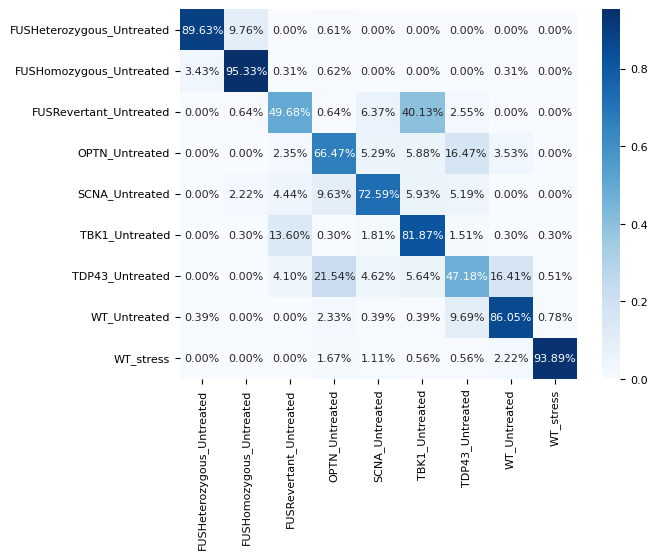


HELDOUT SET - One-vs-rest Confusion Matrix:
[[147  16   0   1   0   0   0   0   0]
 [ 11 306   1   2   0   0   0   1   0]
 [  0   1  78   1  10  63   4   0   0]
 [  0   0   4 113   9  10  28   6   0]
 [  0   3   6  13  98   8   7   0   0]
 [  0   1  45   1   6 271   5   1   1]
 [  0   0   8  42   9  11  92  32   1]
 [  1   0   0   6   1   1  25 222   2]
 [  0   0   0   3   2   1   1   4 169]]
Sensitivity, hit rate, recall, or true positive rate: [0.89634146 0.95327103 0.49681529 0.66470588 0.72592593 0.81873112
 0.47179487 0.86046512 0.93888889]
Specificity or true negative rate: [0.99313108 0.98679245 0.96351197 0.9603676  0.97916667 0.94050633
 0.95920746 0.97338173 0.9976892 ]
Precision or positive predictive value: [0.9245283  0.93577982 0.54929577 0.62087912 0.72592593 0.74246575
 0.56790123 0.83458647 0.97687861]
Negative predictive value: [0.9902968  0.9905303  0.955342   0.96703297 0.97916667 0.96119017
 0.94110921 0.9781155  0.99367089]
Fall out or false positive rate: [0.006

In [9]:
from sklearn.neighbors import KNeighborsClassifier

knc = KNeighborsClassifier()
fit_eval(knc, X, y)

################## 2 UMAPS ##################
X_train shape (4771, 2), X_test shape: (1193, 2), y_train shape: (4771,), y_test shape: (1193,)


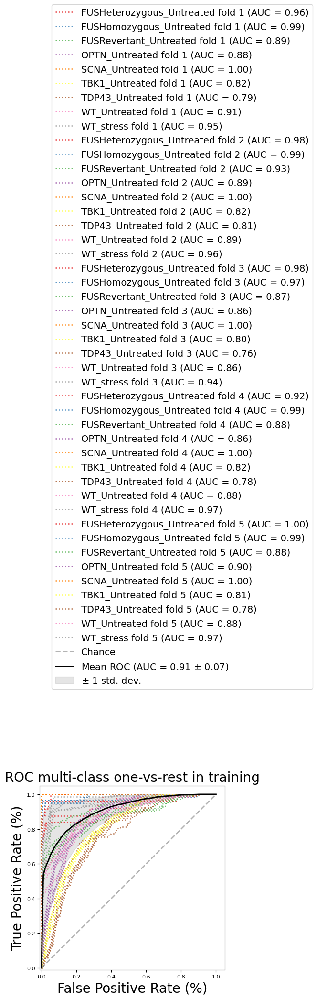



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.95743824 0.99171159 0.88938607 0.8756554  1.         0.81647029
 0.79055467 0.90960428 0.95126468 0.9797043  0.99111486 0.92820593
 0.88976765 1.         0.82109082 0.81165424 0.89165706 0.95749137
 0.97688172 0.97158225 0.86861406 0.85797531 1.         0.80347796
 0.7639004  0.86044521 0.94427765 0.921507   0.98674573 0.88457694
 0.86176027 1.         0.81574682 0.78445324 0.88296285 0.9689323
 0.99511649 0.99144727 0.88074353 0.89514566 1.         0.81183898
 0.78010052 0.87983182 0.97022566] Mean: 0.9069124685741498
Validating - Validate classifier

------------------

Balanced accuracy score: 0.6795039660132244. 
Balanced accuracy score (adjusted): 0.6394419617648776


One-vs-One ROC AUC scores:
0.934211 (macro),
0.915064 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.911533 (macro),
0.882387 (weighted by prevalence)


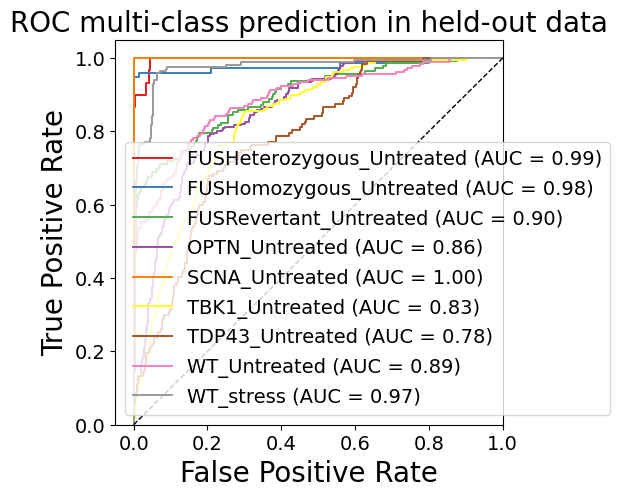

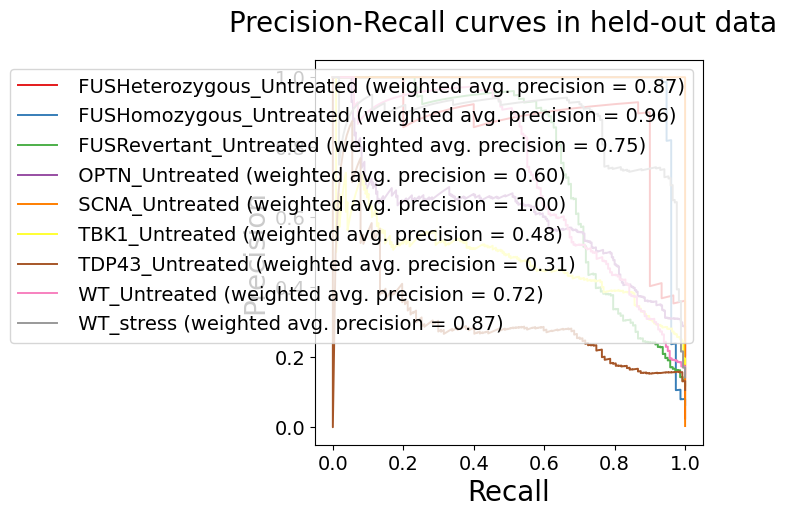

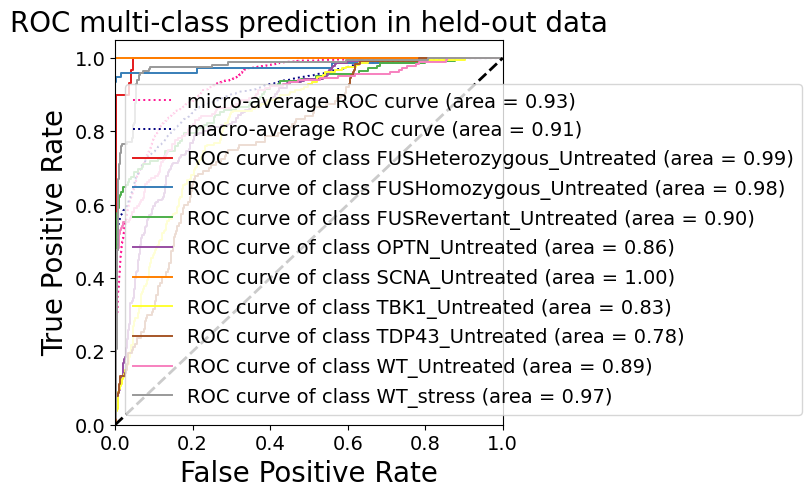


HELDOUT SET - AUC ROC scores of each class: {0: 0.9948982516480367, 1: 0.979468029967488, 2: 0.8967046809879258, 3: 0.859437699130285, 4: 1.0, 5: 0.8300826414951287, 6: 0.7829770575113383, 7: 0.8870205053292215, 8: 0.9732102811799207, 'micro': 0.9322436727515705, 'macro': 0.9119170065906983}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.92      0.73      0.81        30
  FUSHomozygous_Untreated       0.94      0.95      0.94        76
   FUSRevertant_Untreated       0.89      0.63      0.74       142
           OPTN_Untreated       0.51      0.75      0.61       245
           SCNA_Untreated       1.00      1.00      1.00         4
           TBK1_Untreated       0.43      0.64      0.51       216
          TDP43_Untreated       0.00      0.00      0.00       127
             WT_Untreated       0.95      0.47      0.63       183
                WT_stress       0.74      0.94      0.83      

/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter t

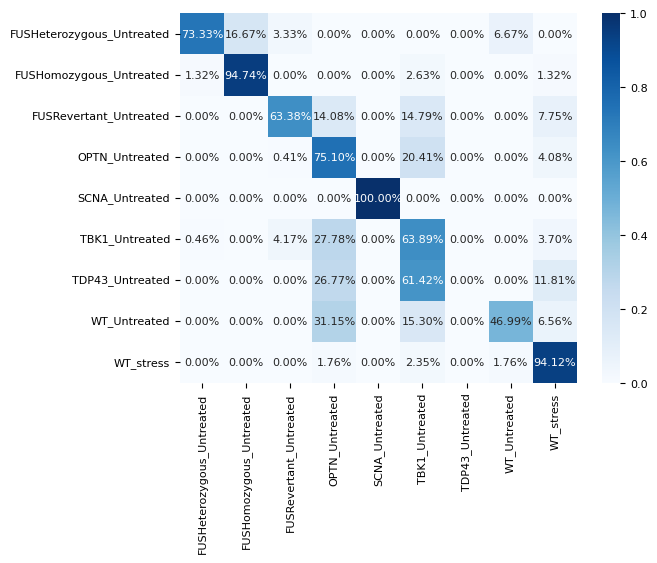


HELDOUT SET - One-vs-rest Confusion Matrix:
[[ 22   5   1   0   0   0   0   2   0]
 [  1  72   0   0   0   2   0   0   1]
 [  0   0  90  20   0  21   0   0  11]
 [  0   0   1 184   0  50   0   0  10]
 [  0   0   0   0   4   0   0   0   0]
 [  1   0   9  60   0 138   0   0   8]
 [  0   0   0  34   0  78   0   0  15]
 [  0   0   0  57   0  28   0  86  12]
 [  0   0   0   3   0   4   0   3 160]]
Sensitivity, hit rate, recall, or true positive rate: [0.73333333 0.94736842 0.63380282 0.75102041 1.         0.63888889
 0.         0.46994536 0.94117647]
Specificity or true negative rate: [0.99828031 0.99552372 0.98953378 0.8164557  1.         0.81269191
 1.         0.9950495  0.94428152]
Precision or positive predictive value: [0.91666667 0.93506494 0.89108911 0.51396648 1.         0.42990654
        nan 0.94505495 0.73732719]
Negative predictive value: [0.99315654 0.99641577 0.95238095 0.92694611 1.         0.91055046
 0.89354568 0.91197822 0.9897541 ]
Fall out or false positive rate: [0.001

/tmp/ipykernel_40869/3679406993.py:198: RuntimeWarning: invalid value encountered in divide
  PPV = TP / (TP + FP)
/tmp/ipykernel_40869/3679406993.py:210: RuntimeWarning: invalid value encountered in divide
  FDR = FP / (TP + FP)


Performance score roc_auc_ovr_weighted on the held-out test-set (25%): 0.633696563285834
################## 100 UMAPS ##################
X_train shape (4771, 100), X_test shape: (1193, 100), y_train shape: (4771,), y_test shape: (1193,)


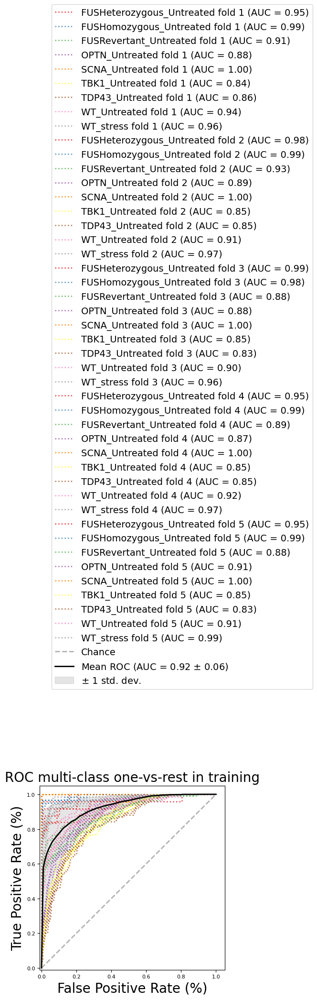



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.95251522 0.99416878 0.90967311 0.88220941 1.         0.83877859
 0.86299795 0.94432497 0.96355014 0.98181004 0.99208782 0.93092105
 0.89411583 1.         0.84770713 0.84623262 0.91067917 0.97071408
 0.99310036 0.97725479 0.87529595 0.87599997 1.         0.84599715
 0.82694698 0.89883697 0.96319035 0.94768568 0.99177574 0.89451033
 0.8721259  1.         0.85319695 0.85143872 0.92424281 0.97148284
 0.95403226 0.99298423 0.88390769 0.90724786 1.         0.85318955
 0.83366801 0.90606775 0.98553792] Mean: 0.9244933921204972
Validating - Validate classifier

------------------

Balanced accuracy score: 0.6042112070418421. 
Balanced accuracy score (adjusted): 0.5547376079220724


One-vs-One ROC AUC scores:
0.946553 (macro),
0.933477 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.930603 (macro),
0.909841 (weighted by prevalence)


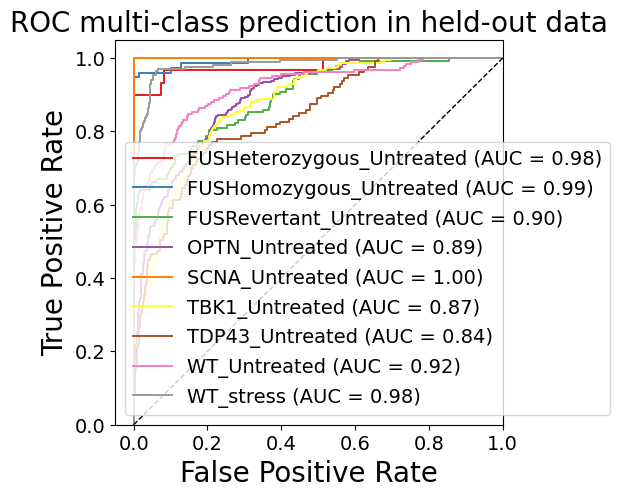

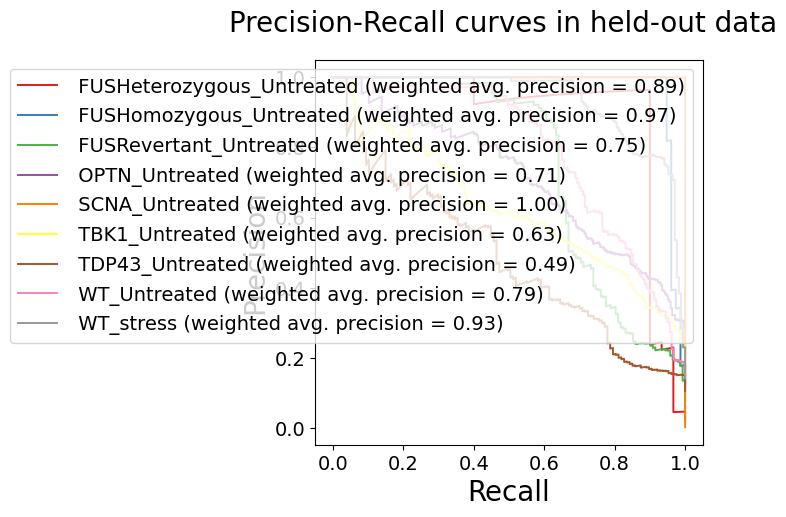

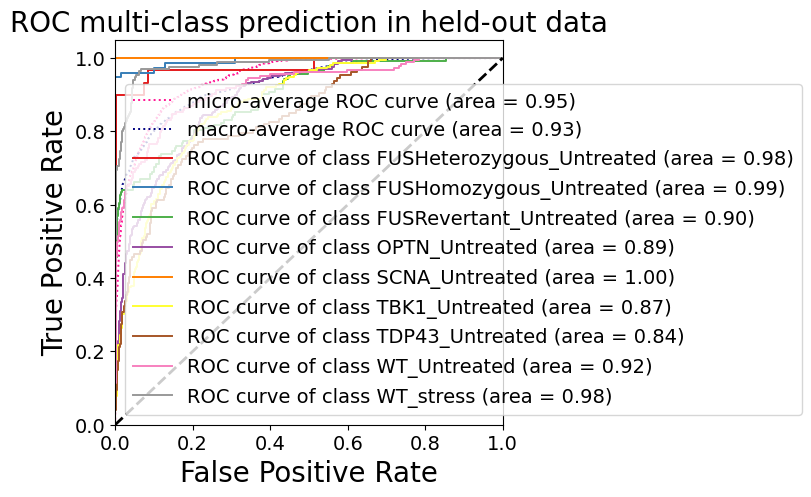


HELDOUT SET - AUC ROC scores of each class: {0: 0.9772141014617369, 1: 0.9927201620883004, 2: 0.8968587931011378, 3: 0.8918970119693447, 4: 1.0, 5: 0.8734931195268965, 6: 0.8412861384822208, 7: 0.9198290320835362, 8: 0.982128687252027, 'micro': 0.9453056000741964, 'macro': 0.9309659486768614}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.00      0.00      0.00        30
  FUSHomozygous_Untreated       0.73      0.96      0.83        76
   FUSRevertant_Untreated       0.92      0.54      0.68       142
           OPTN_Untreated       0.51      0.76      0.61       245
           SCNA_Untreated       1.00      1.00      1.00         4
           TBK1_Untreated       0.46      0.67      0.54       216
          TDP43_Untreated       0.65      0.10      0.18       127
             WT_Untreated       0.95      0.47      0.63       183
                WT_stress       0.76      0.94      0.84     

/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter t

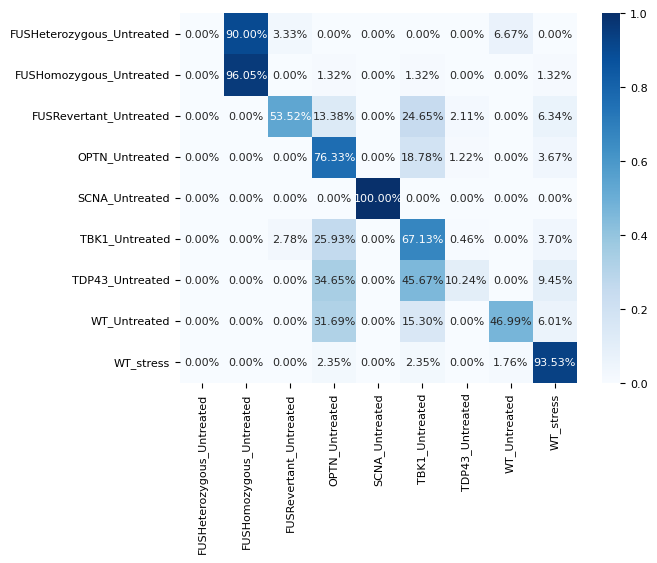


HELDOUT SET - One-vs-rest Confusion Matrix:
[[  0  27   1   0   0   0   0   2   0]
 [  0  73   0   1   0   1   0   0   1]
 [  0   0  76  19   0  35   3   0   9]
 [  0   0   0 187   0  46   3   0   9]
 [  0   0   0   0   4   0   0   0   0]
 [  0   0   6  56   0 145   1   0   8]
 [  0   0   0  44   0  58  13   0  12]
 [  0   0   0  58   0  28   0  86  11]
 [  0   0   0   4   0   4   0   3 159]]
Sensitivity, hit rate, recall, or true positive rate: [0.         0.96052632 0.53521127 0.76326531 1.         0.6712963
 0.1023622  0.46994536 0.93529412]
Specificity or true negative rate: [1.         0.97582811 0.99333968 0.80801688 1.         0.82395087
 0.9934334  0.9950495  0.95112414]
Precision or positive predictive value: [       nan 0.73       0.91566265 0.50677507 1.         0.45741325
 0.65       0.94505495 0.76076555]
Negative predictive value: [0.97485331 0.99725526 0.94054054 0.92961165 1.         0.91894977
 0.9028133  0.91197822 0.98882114]
Fall out or false positive rate: [0.    

/tmp/ipykernel_40869/3679406993.py:198: RuntimeWarning: invalid value encountered in divide
  PPV = TP / (TP + FP)
/tmp/ipykernel_40869/3679406993.py:210: RuntimeWarning: invalid value encountered in divide
  FDR = FP / (TP + FP)


Performance score roc_auc_ovr_weighted on the held-out test-set (25%): 0.622799664710813
!!!! MLP !!!
X_train shape (4771, 100), X_test shape: (1193, 100), y_train shape: (4771,), y_test shape: (1193,)


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochas

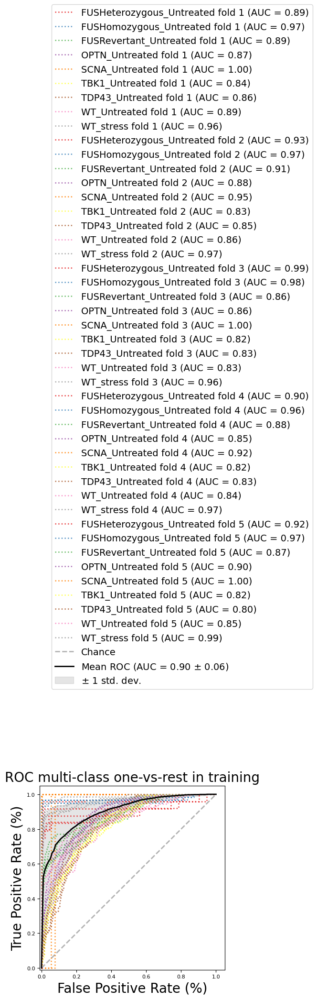



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.89263337 0.97165071 0.88940693 0.86834853 0.99763407 0.84200878
 0.86237731 0.89369592 0.96117435 0.93346774 0.97167404 0.90743525
 0.88191939 0.94567122 0.83154404 0.84637071 0.86018242 0.97331188
 0.98570789 0.97541901 0.85737586 0.86077155 1.         0.81841432
 0.82804014 0.82914858 0.96106896 0.89752422 0.96102656 0.88346153
 0.85483415 0.9232387  0.81781916 0.83419034 0.84040159 0.96743092
 0.925      0.97421525 0.86678154 0.89752167 1.         0.82487992
 0.80478915 0.84797572 0.98513092] Mean: 0.9011705402876967


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Validating - Validate classifier

------------------

Balanced accuracy score: 0.5034304217155368. 
Balanced accuracy score (adjusted): 0.4413592244299789


One-vs-One ROC AUC scores:
0.921724 (macro),
0.919429 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.921182 (macro),
0.899030 (weighted by prevalence)


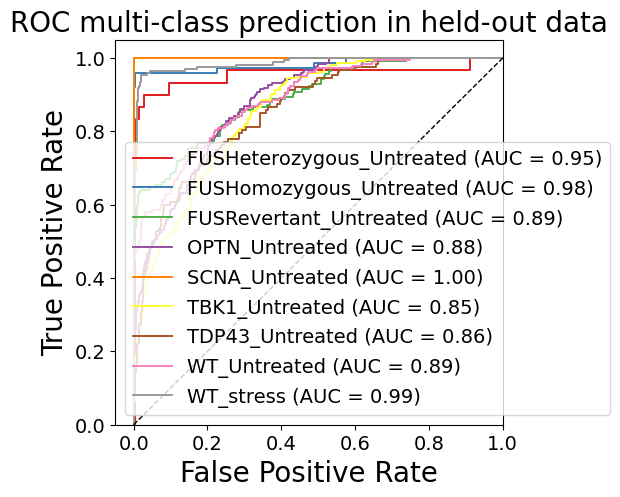

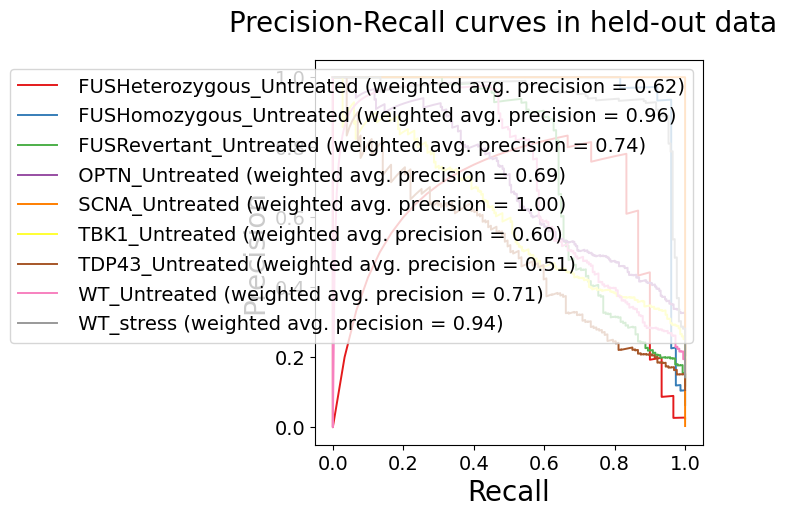

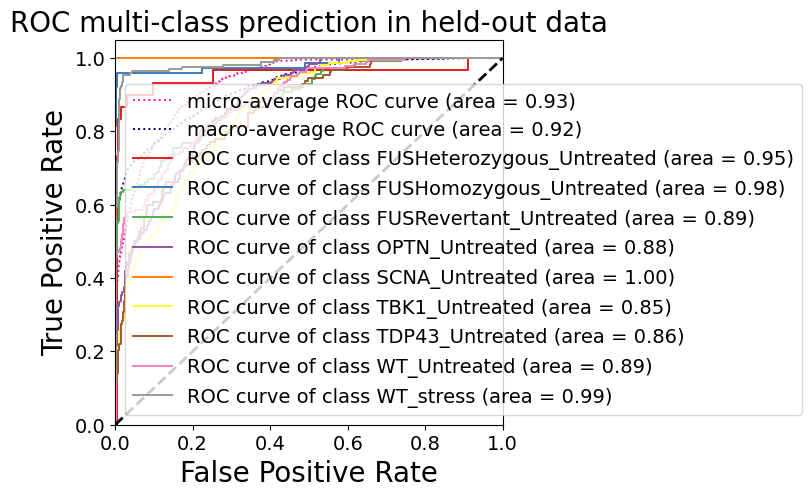


HELDOUT SET - AUC ROC scores of each class: {0: 0.9533104041272571, 1: 0.982648541676483, 2: 0.8916524838852334, 3: 0.8793808662705589, 4: 1.0, 5: 0.8545623412563024, 6: 0.8571228080542466, 7: 0.886630958177785, 8: 0.9853257432005059, 'micro': 0.931210122051728, 'macro': 0.9218025594337866}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.00      0.00      0.00        30
  FUSHomozygous_Untreated       0.73      0.96      0.83        76
   FUSRevertant_Untreated       0.72      0.64      0.68       142
           OPTN_Untreated       0.51      0.72      0.60       245
           SCNA_Untreated       0.00      0.00      0.00         4
           TBK1_Untreated       0.48      0.48      0.48       216
          TDP43_Untreated       0.61      0.29      0.39       127
             WT_Untreated       0.86      0.48      0.61       183
                WT_stress       0.70      0.96      0.81       

/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter t

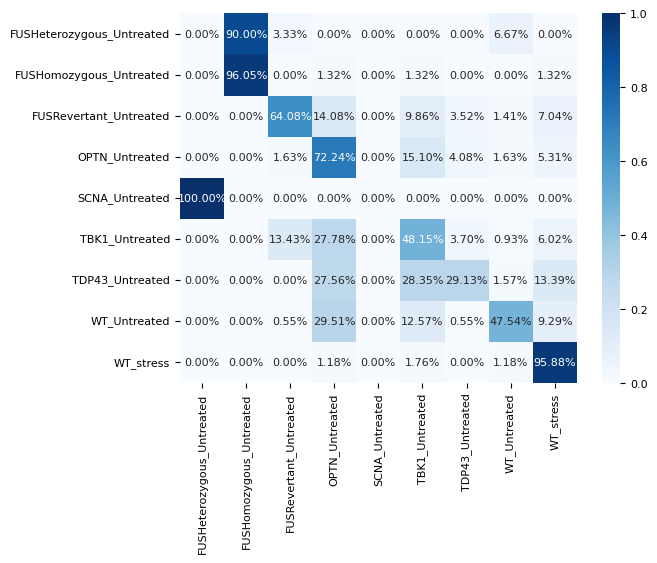


HELDOUT SET - One-vs-rest Confusion Matrix:
[[  0  27   1   0   0   0   0   2   0]
 [  0  73   0   1   0   1   0   0   1]
 [  0   0  91  20   0  14   5   2  10]
 [  0   0   4 177   0  37  10   4  13]
 [  4   0   0   0   0   0   0   0   0]
 [  0   0  29  60   0 104   8   2  13]
 [  0   0   0  35   0  36  37   2  17]
 [  0   0   1  54   0  23   1  87  17]
 [  0   0   0   2   0   3   0   2 163]]
Sensitivity, hit rate, recall, or true positive rate: [0.         0.96052632 0.64084507 0.72244898 0.         0.48148148
 0.29133858 0.47540984 0.95882353]
Specificity or true negative rate: [0.99656062 0.97582811 0.96669838 0.8185654  1.         0.88331627
 0.97748593 0.98613861 0.93059629]
Precision or positive predictive value: [0.         0.73       0.72222222 0.50716332        nan 0.47706422
 0.60655738 0.86138614 0.6965812 ]
Negative predictive value: [0.97476871 0.99725526 0.95220244 0.91943128 0.99664711 0.88512821
 0.9204947  0.91208791 0.99270073]
Fall out or false positive rate: [0.003

/tmp/ipykernel_40869/3679406993.py:198: RuntimeWarning: invalid value encountered in divide
  PPV = TP / (TP + FP)
/tmp/ipykernel_40869/3679406993.py:210: RuntimeWarning: invalid value encountered in divide
  FDR = FP / (TP + FP)


In [18]:
X100 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/features/sm_embeddings_batch5_16bit_no_downsample_vqvec2_UMAP100.npy")
X.shape, y.shape


print("################## 2 UMAPS ##################")

svc = SVC(kernel='rbf', random_state=1, probability=True)
fit_eval(svc, X, y)

print("################## 100 UMAPS ##################") # Might be worse since SVC isn't strong enough for 100 features?
svc = SVC(kernel='rbf', random_state=1, probability=True)
fit_eval(svc, X100, y)

print("!!!! MLP !!!")
fit_eval(mlp, X100, y)


################## 100 UMAPS ##################
X_train shape (7642, 100), X_test shape: (1911, 100), y_train shape: (7642,), y_test shape: (1911,)


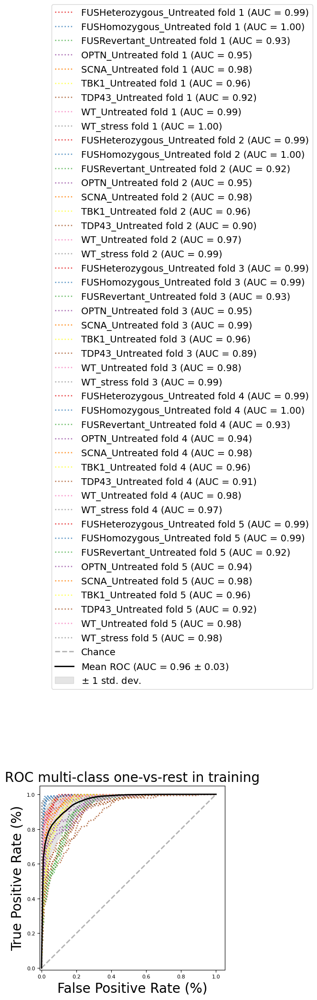



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.98866975 0.99558892 0.92769462 0.94944259 0.9799437  0.96120731
 0.91831008 0.98518202 0.99564577 0.99232273 0.9956501  0.92164183
 0.95076749 0.97882295 0.96384643 0.89624535 0.96662574 0.9924419
 0.99135028 0.99442824 0.92696793 0.94753106 0.98646805 0.9641136
 0.89224041 0.98222023 0.98942277 0.99073806 0.99582118 0.92558232
 0.94392598 0.98069451 0.95716996 0.91229349 0.98372942 0.97441494
 0.98796221 0.99379759 0.91880257 0.93862966 0.97738425 0.95798264
 0.91857292 0.97563636 0.98418935] Mean: 0.9633804275133867
Validating - Validate classifier

------------------

Balanced accuracy score: 0.6978330185971143. 
Balanced accuracy score (adjusted): 0.6600621459217537


One-vs-One ROC AUC scores:
0.966627 (macro),
0.968369 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.968326 (macro),
0.970917 (weighted by prevalence)


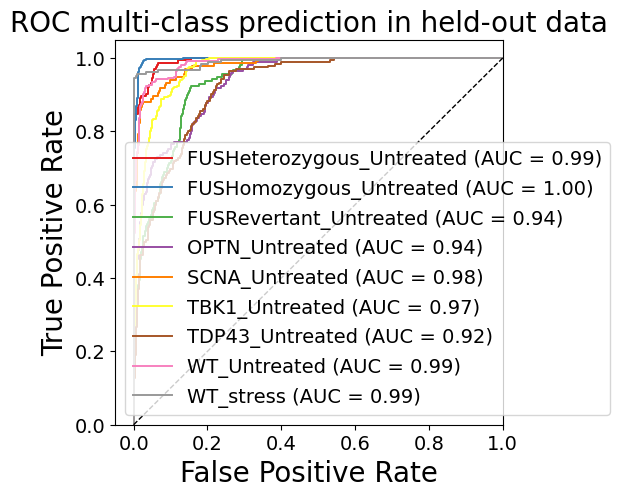

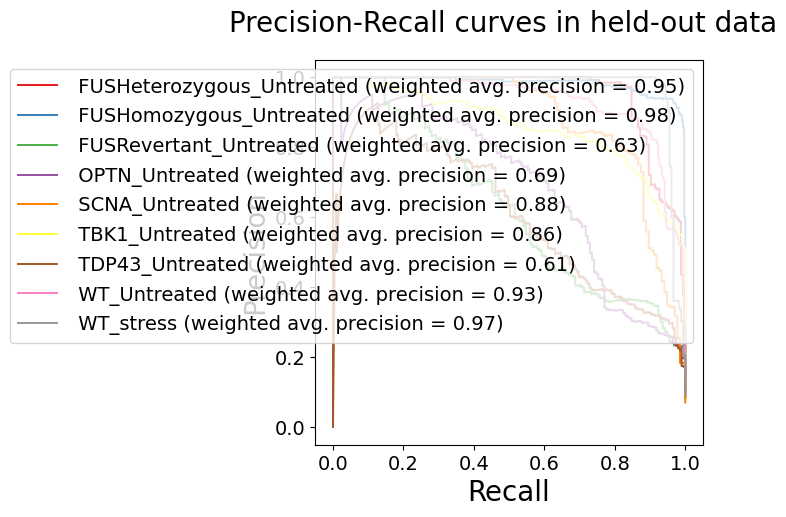

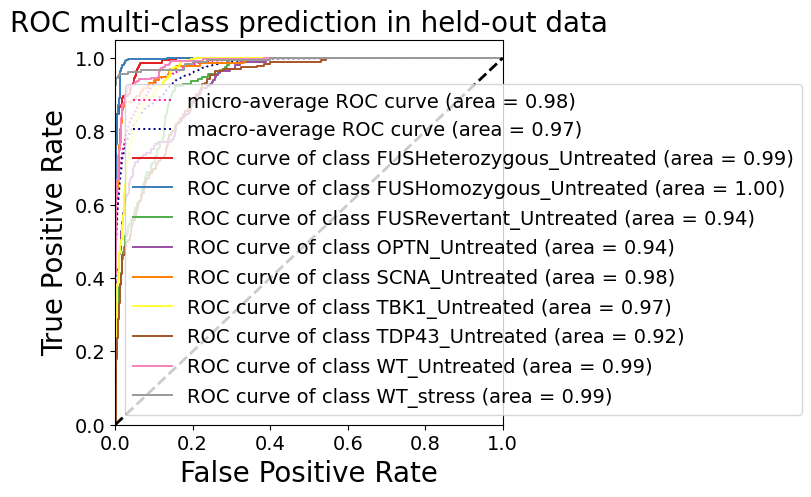


HELDOUT SET - AUC ROC scores of each class: {0: 0.9929740181775029, 1: 0.996800485902937, 2: 0.9378599597643965, 3: 0.9365442443490894, 4: 0.9807474140807474, 5: 0.969486404833837, 6: 0.9228617536309844, 7: 0.9860014912984145, 8: 0.9916586430451249, 'micro': 0.9763409449437707, 'macro': 0.968513649976333}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.97      0.85      0.91       164
  FUSHomozygous_Untreated       0.92      0.96      0.94       321
   FUSRevertant_Untreated       0.50      0.02      0.04       157
           OPTN_Untreated       0.65      0.66      0.65       170
           SCNA_Untreated       0.93      0.64      0.76       135
           TBK1_Untreated       0.52      0.99      0.68       331
          TDP43_Untreated       0.80      0.31      0.45       195
             WT_Untreated       0.83      0.91      0.87       258
                WT_stress       0.99      0.93  

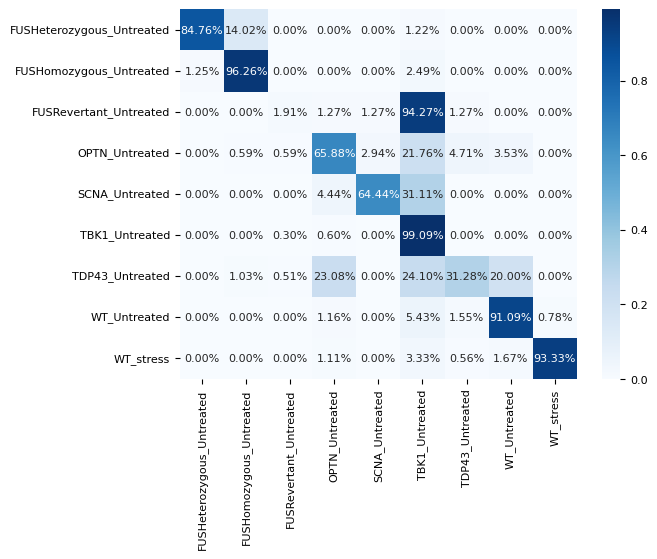


HELDOUT SET - One-vs-rest Confusion Matrix:
[[139  23   0   0   0   2   0   0   0]
 [  4 309   0   0   0   8   0   0   0]
 [  0   0   3   2   2 148   2   0   0]
 [  0   1   1 112   5  37   8   6   0]
 [  0   0   0   6  87  42   0   0   0]
 [  0   0   1   2   0 328   0   0   0]
 [  0   2   1  45   0  47  61  39   0]
 [  0   0   0   3   0  14   4 235   2]
 [  0   0   0   2   0   6   1   3 168]]
Sensitivity, hit rate, recall, or true positive rate: [0.84756098 0.96261682 0.01910828 0.65882353 0.64444444 0.99093656
 0.31282051 0.91085271 0.93333333]
Specificity or true negative rate: [0.99771036 0.9836478  0.99828962 0.96553705 0.99605856 0.80759494
 0.99125874 0.97096189 0.9988446 ]
Precision or positive predictive value: [0.97202797 0.92238806 0.5        0.65116279 0.92553191 0.51898734
 0.80263158 0.83038869 0.98823529]
Negative predictive value: [0.98585973 0.99238579 0.9191601  0.9666475  0.97358283 0.99765442
 0.92697548 0.98587224 0.99310741]
Fall out or false positive rate: [0.002

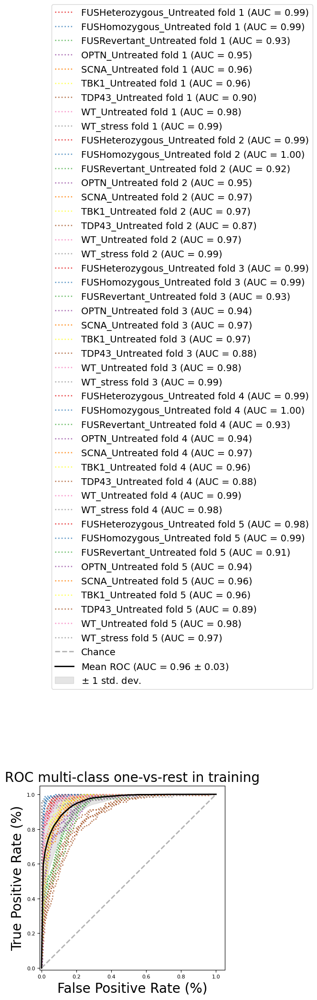



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.9897236  0.99241979 0.92509249 0.94500338 0.96382959 0.95839503
 0.89963957 0.98206494 0.98832481 0.99245378 0.99629249 0.9229429
 0.94790127 0.97024787 0.96966205 0.86977328 0.96981955 0.99356199
 0.99217564 0.9944864  0.92733286 0.94140889 0.96686515 0.96886718
 0.87626149 0.98470617 0.99059188 0.99260138 0.99611201 0.93032644
 0.93808194 0.96888234 0.96163671 0.88488637 0.98533041 0.98236794
 0.98451425 0.99283936 0.91244476 0.93969317 0.95898391 0.96097342
 0.89095556 0.97945522 0.97459558] Mean: 0.958989440721618
Validating - Validate classifier

------------------

Balanced accuracy score: 0.719418775146096. 
Balanced accuracy score (adjusted): 0.6843461220393581


One-vs-One ROC AUC scores:
0.962393 (macro),
0.964788 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.964086 (macro),
0.968156 (weighted by prevalence)


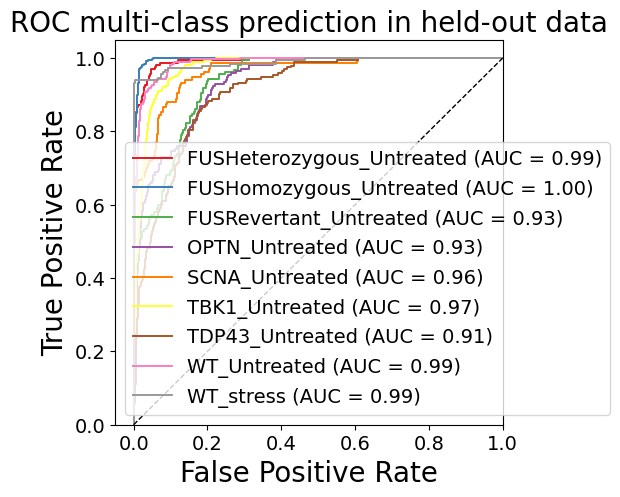

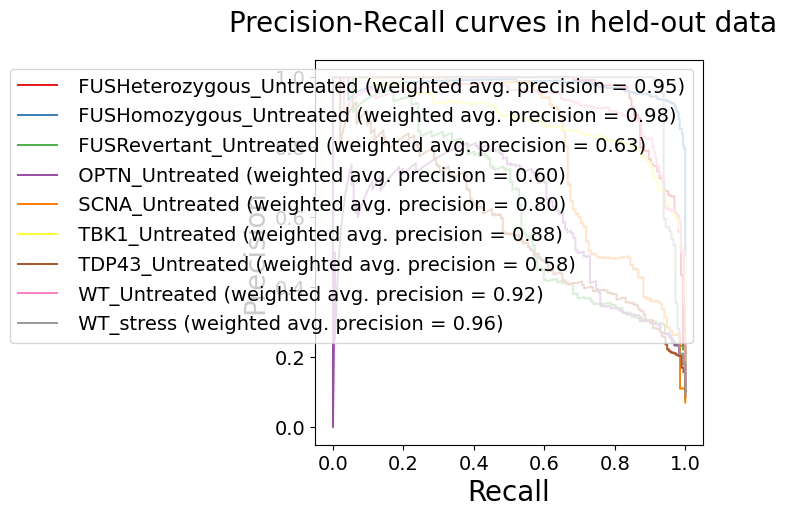

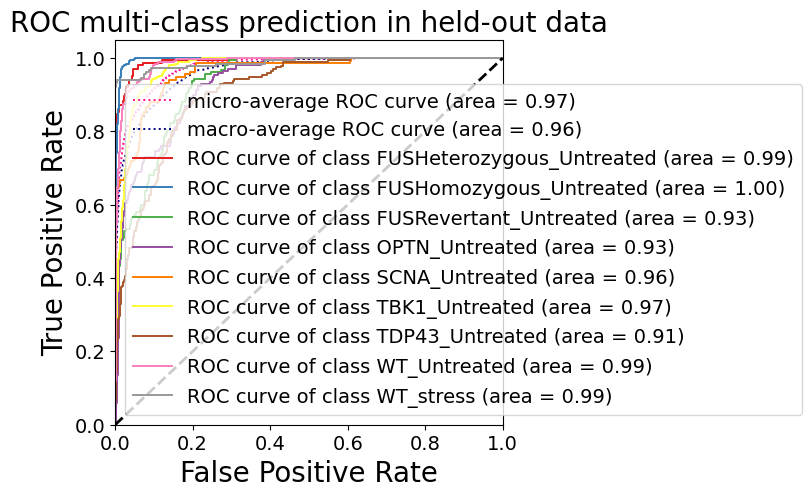


HELDOUT SET - AUC ROC scores of each class: {0: 0.9925167883619306, 1: 0.9964732851348969, 2: 0.9330229720602227, 3: 0.9330911916748319, 4: 0.9620036703370036, 5: 0.9745879383532832, 6: 0.9103490526567449, 7: 0.9867565197409455, 8: 0.9879741960331214, 'micro': 0.9749135112725603, 'macro': 0.9643075539422727}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.97      0.84      0.90       164
  FUSHomozygous_Untreated       0.91      0.97      0.94       321
   FUSRevertant_Untreated       0.77      0.32      0.46       157
           OPTN_Untreated       0.60      0.66      0.63       170
           SCNA_Untreated       0.91      0.65      0.76       135
           TBK1_Untreated       0.56      0.96      0.71       331
          TDP43_Untreated       0.74      0.25      0.38       195
             WT_Untreated       0.83      0.90      0.86       258
                WT_stress       0.99      0.9

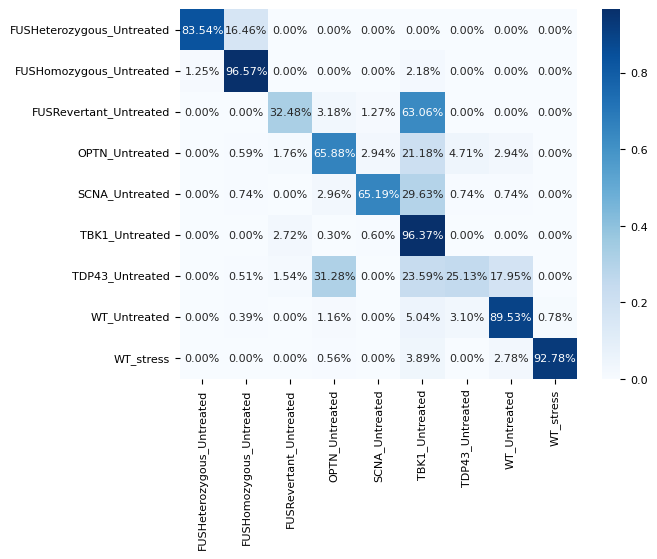


HELDOUT SET - One-vs-rest Confusion Matrix:
[[137  27   0   0   0   0   0   0   0]
 [  4 310   0   0   0   7   0   0   0]
 [  0   0  51   5   2  99   0   0   0]
 [  0   1   3 112   5  36   8   5   0]
 [  0   1   0   4  88  40   1   1   0]
 [  0   0   9   1   2 319   0   0   0]
 [  0   1   3  61   0  46  49  35   0]
 [  0   1   0   3   0  13   8 231   2]
 [  0   0   0   1   0   7   0   5 167]]
Sensitivity, hit rate, recall, or true positive rate: [0.83536585 0.96573209 0.32484076 0.65882353 0.65185185 0.96374622
 0.25128205 0.89534884 0.92777778]
Specificity or true negative rate: [0.99771036 0.98050314 0.99144812 0.95692131 0.99493243 0.84303797
 0.99009324 0.97217181 0.9988446 ]
Precision or positive predictive value: [0.97163121 0.90909091 0.77272727 0.59893048 0.90721649 0.56261023
 0.74242424 0.83393502 0.98816568]
Negative predictive value: [0.98474576 0.99299363 0.94254743 0.96635731 0.97409041 0.99107143
 0.92086721 0.98347613 0.99253731]
Fall out or false positive rate: [0.002

In [11]:
X100 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/features/sm_embeddings_batch9_16bit_no_downsample_vqvec2_UMAP100.npy")
X.shape, y.shape

print("################## 100 UMAPS ##################") # Might be worse since SVC isn't strong enough for 100 features?
svc = SVC(kernel='rbf', random_state=1, probability=True)
fit_eval(svc, X100, y)


print("################## 2 UMAPS ##################")

fit_eval(svc, X, y)

X_train shape (7642, 100), X_test shape: (1911, 100), y_train shape: (7642,), y_test shape: (1911,)


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Using label binarize
(1529, 9) (1529, 9)


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Using label binarize
(1529, 9) (1529, 9)


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Using label binarize
(1528, 9) (1528, 9)


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Using label binarize
(1528, 9) (1528, 9)


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Using label binarize
(1528, 9) (1528, 9)


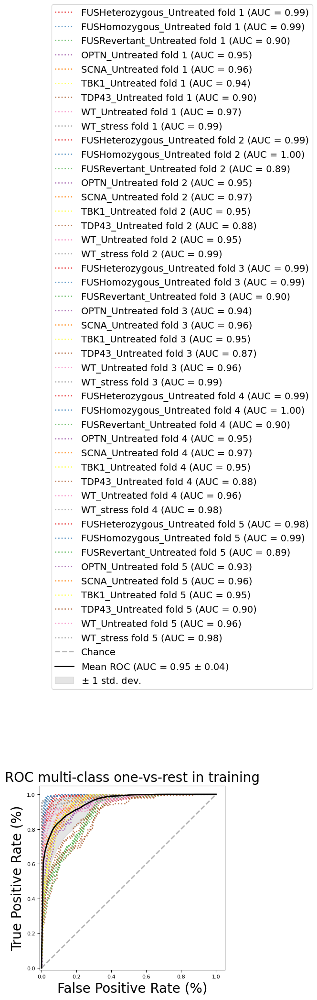



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.99061364 0.99489453 0.89755513 0.94866665 0.95948341 0.93853594
 0.90122229 0.9663334  0.99093835 0.99267765 0.9955308  0.89142314
 0.9511581  0.97051503 0.95340041 0.87745812 0.95283826 0.99232586
 0.99239573 0.99445579 0.90064148 0.941018   0.96311526 0.95395808
 0.87263587 0.95635842 0.990908   0.99078724 0.99652836 0.89834355
 0.94500013 0.9716689  0.95335156 0.88094304 0.96458734 0.98400871
 0.98423011 0.99184135 0.88829081 0.93417883 0.9561133  0.94794066
 0.89775828 0.95889209 0.98433486] Mean: 0.952441253885995


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Validating - Validate classifier

------------------

Balanced accuracy score: 0.6999914974165105. 
Balanced accuracy score (adjusted): 0.6624904345935743


One-vs-One ROC AUC scores:
0.957088 (macro),
0.959070 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.958610 (macro),
0.962168 (weighted by prevalence)


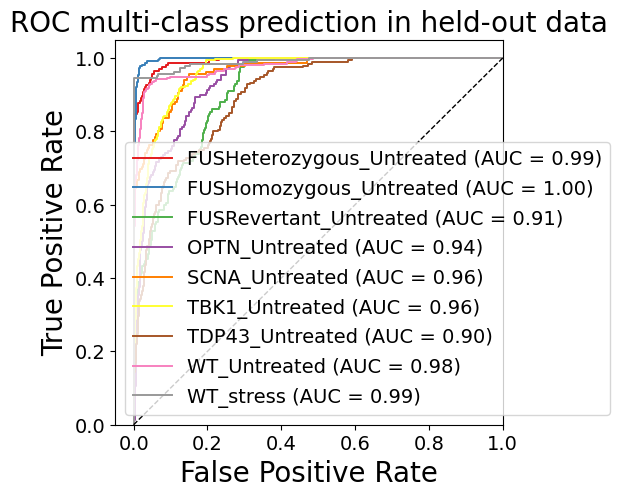

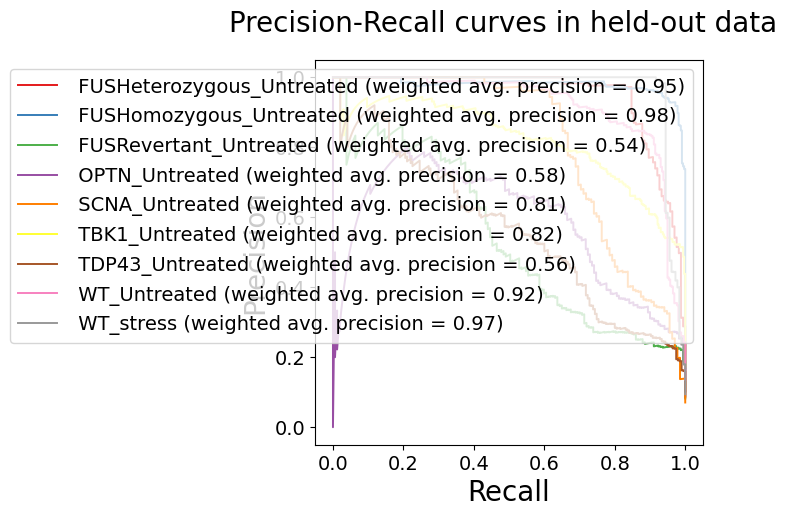

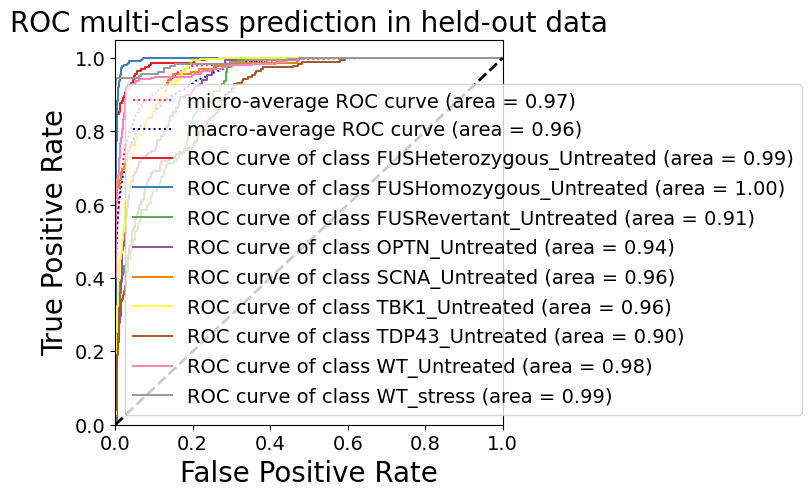


HELDOUT SET - AUC ROC scores of each class: {0: 0.9917070378488558, 1: 0.9965790865808499, 2: 0.9098475549971312, 3: 0.9396830759874312, 4: 0.9635301968635303, 5: 0.9608168572411947, 6: 0.8986342717111948, 7: 0.9772225270473698, 8: 0.9894730085371334, 'micro': 0.970608619408799, 'macro': 0.9588109518455404}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.90      0.85      0.88       164
  FUSHomozygous_Untreated       0.93      0.93      0.93       321
   FUSRevertant_Untreated       0.55      0.14      0.22       157
           OPTN_Untreated       0.63      0.66      0.64       170
           SCNA_Untreated       0.84      0.66      0.74       135
           TBK1_Untreated       0.54      0.96      0.69       331
          TDP43_Untreated       0.77      0.26      0.38       195
             WT_Untreated       0.82      0.90      0.86       258
                WT_stress       0.99      0.93

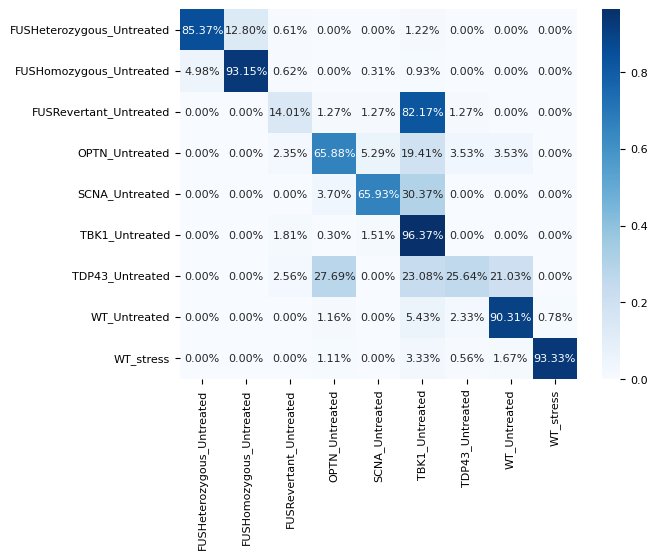


HELDOUT SET - One-vs-rest Confusion Matrix:
[[140  21   1   0   0   2   0   0   0]
 [ 16 299   2   0   1   3   0   0   0]
 [  0   0  22   2   2 129   2   0   0]
 [  0   0   4 112   9  33   6   6   0]
 [  0   0   0   5  89  41   0   0   0]
 [  0   0   6   1   5 319   0   0   0]
 [  0   0   5  54   0  45  50  41   0]
 [  0   0   0   3   0  14   6 233   2]
 [  0   0   0   2   0   6   1   3 168]]
Sensitivity, hit rate, recall, or true positive rate: [0.85365854 0.93146417 0.14012739 0.65882353 0.65925926 0.96374622
 0.25641026 0.90310078 0.93333333]
Specificity or true negative rate: [0.99084144 0.98679245 0.98973774 0.96151637 0.99042793 0.82721519
 0.99125874 0.96975197 0.9988446 ]
Precision or positive predictive value: [0.8974359  0.934375   0.55       0.62569832 0.83962264 0.53885135
 0.76923077 0.82332155 0.98823529]
Negative predictive value: [0.98632479 0.98617222 0.92784607 0.9665127  0.97451524 0.9909022
 0.92145179 0.98464373 0.99310741]
Fall out or false positive rate: [0.0091

In [94]:
X100 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/features/sm_embeddings_batch9_16bit_no_downsample_vqvec2_UMAP100.npy")
X.shape, y.shape

fit_eval(mlp, X100, y)

---------------------- Kernel = linear ---------------------
X_train shape (7642, 2), X_test shape: (1911, 2), y_train shape: (7642,), y_test shape: (1911,)


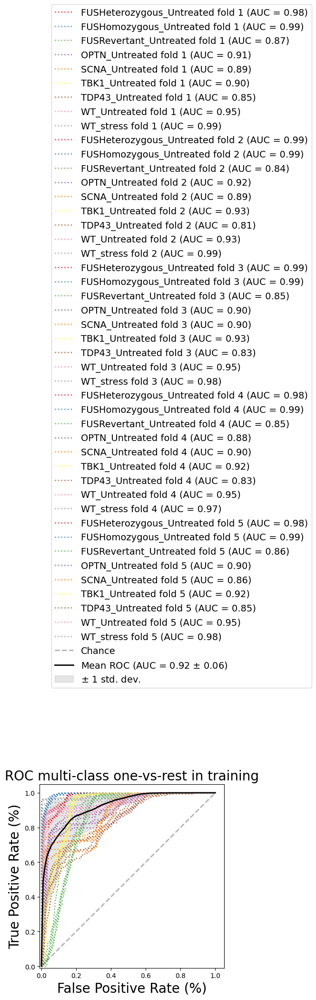



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.98043552 0.99146233 0.87049859 0.90933132 0.88961868 0.90472892
 0.84839487 0.95322926 0.99165481 0.98523518 0.99354856 0.8380002
 0.92368354 0.89339797 0.92852579 0.80901358 0.93177882 0.98895549
 0.9851271  0.99102395 0.84769209 0.89875444 0.90392511 0.92789256
 0.82931057 0.95074027 0.98499217 0.98048709 0.99277201 0.85333713
 0.88139108 0.895365   0.92229642 0.82935262 0.95031065 0.96598025
 0.97735059 0.99006267 0.85837776 0.90027917 0.86489387 0.92330032
 0.85443765 0.94776596 0.97722483] Mean: 0.922576373043151
Validating - Validate classifier

------------------

Balanced accuracy score: 0.6844433537953791. 
Balanced accuracy score (adjusted): 0.6449987730198015


One-vs-One ROC AUC scores:
0.922911 (macro),
0.926905 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.924776 (macro),
0.933408 (weighted by prevalence)


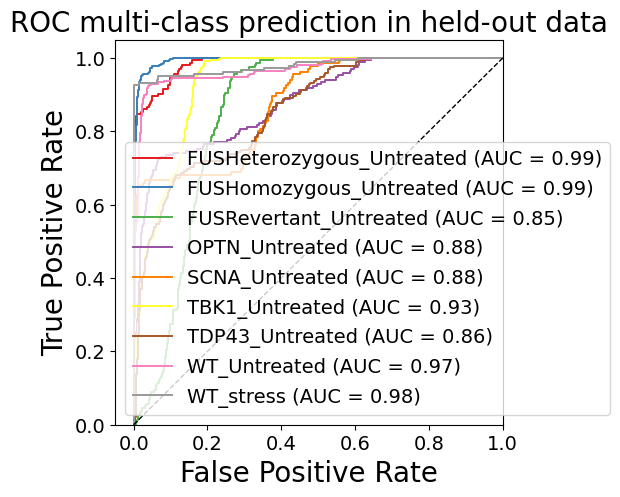

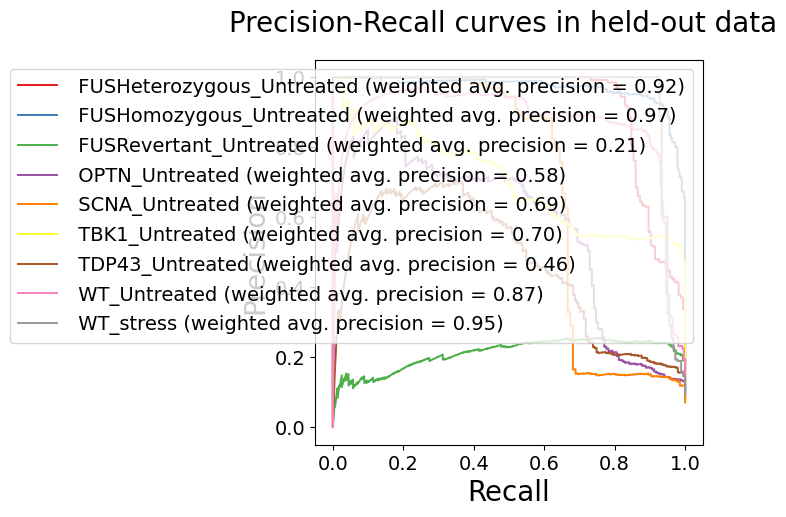

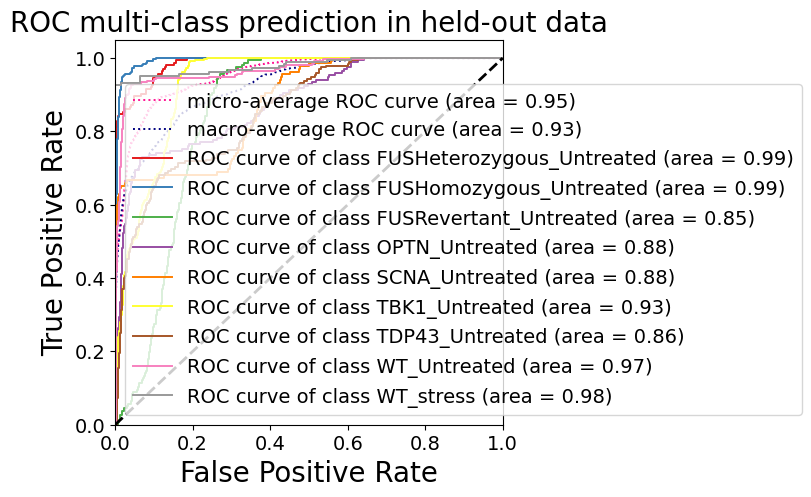


HELDOUT SET - AUC ROC scores of each class: {0: 0.9860597260809472, 1: 0.9941045083171692, 2: 0.8479834990449492, 3: 0.8807176403013819, 4: 0.8777861194527862, 5: 0.9316761635244178, 6: 0.8576474807244039, 7: 0.9676486726037227, 8: 0.9793600359458244, 'micro': 0.953948894294263, 'macro': 0.9250118207597742}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.91      0.83      0.87       164
  FUSHomozygous_Untreated       0.90      0.94      0.92       321
   FUSRevertant_Untreated       0.00      0.00      0.00       157
           OPTN_Untreated       0.66      0.61      0.64       170
           SCNA_Untreated       0.83      0.64      0.72       135
           TBK1_Untreated       0.52      0.99      0.68       331
          TDP43_Untreated       0.72      0.32      0.45       195
             WT_Untreated       0.82      0.90      0.86       258
                WT_stress       1.00      0.93

/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter t

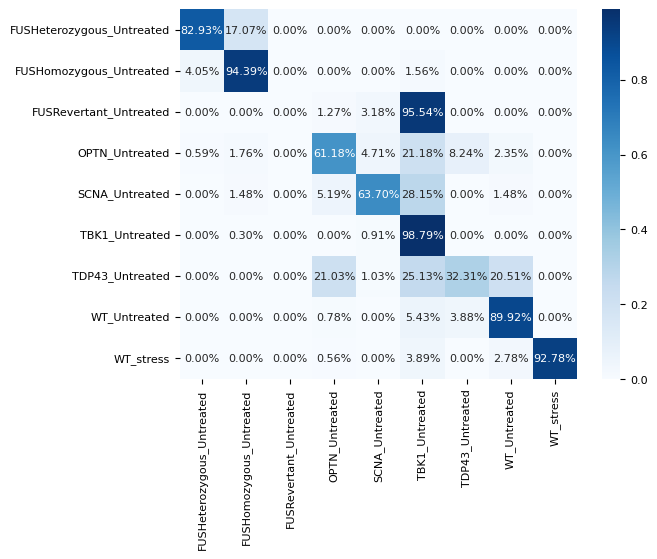


HELDOUT SET - One-vs-rest Confusion Matrix:
[[136  28   0   0   0   0   0   0   0]
 [ 13 303   0   0   0   5   0   0   0]
 [  0   0   0   2   5 150   0   0   0]
 [  1   3   0 104   8  36  14   4   0]
 [  0   2   0   7  86  38   0   2   0]
 [  0   1   0   0   3 327   0   0   0]
 [  0   0   0  41   2  49  63  40   0]
 [  0   0   0   2   0  14  10 232   0]
 [  0   0   0   1   0   7   0   5 167]]
Sensitivity, hit rate, recall, or true positive rate: [0.82926829 0.94392523 0.         0.61176471 0.63703704 0.98791541
 0.32307692 0.89922481 0.92777778]
Specificity or true negative rate: [0.99198626 0.97861635 1.         0.96955773 0.98986486 0.81075949
 0.98601399 0.96914701 1.        ]
Precision or positive predictive value: [0.90666667 0.89910979        nan 0.66242038 0.82692308 0.52236422
 0.72413793 0.81978799 1.        ]
Negative predictive value: [0.98409994 0.98856417 0.91784406 0.96237172 0.97288323 0.99688716
 0.92763158 0.98402948 0.99254587]
Fall out or false positive rate: [0.008

/tmp/ipykernel_40869/3679406993.py:198: RuntimeWarning: invalid value encountered in divide
  PPV = TP / (TP + FP)
/tmp/ipykernel_40869/3679406993.py:210: RuntimeWarning: invalid value encountered in divide
  FDR = FP / (TP + FP)


Performance score roc_auc_ovr_weighted on the held-out test-set (25%): 0.7420198848770277
---------------------- Kernel = poly ---------------------
X_train shape (7642, 2), X_test shape: (1911, 2), y_train shape: (7642,), y_test shape: (1911,)


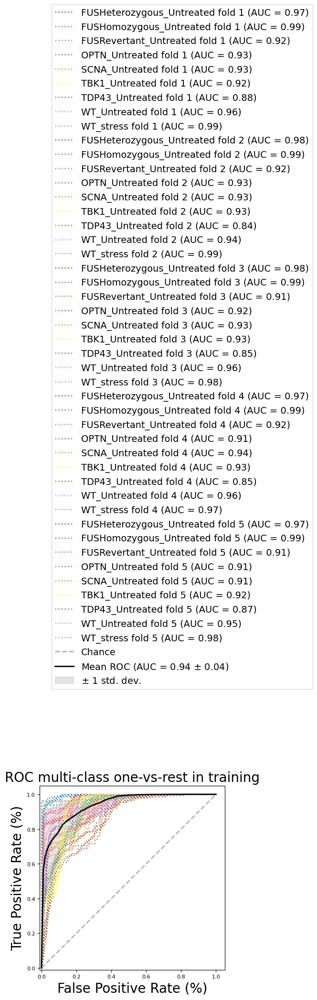



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.97168256 0.98713384 0.91966761 0.92752629 0.92989418 0.92467459
 0.87517975 0.96419201 0.99060535 0.98281624 0.99195177 0.91825906
 0.93262531 0.9270141  0.93236506 0.84120492 0.94073173 0.98860231
 0.98457687 0.98852278 0.91431504 0.91706812 0.93381435 0.9318962
 0.84826568 0.95766197 0.98460079 0.97064047 0.99012083 0.91655025
 0.91349871 0.93596085 0.92682592 0.85250336 0.96275502 0.97069685
 0.97319228 0.99081577 0.90600713 0.91473771 0.90837326 0.92218587
 0.8717902  0.95472805 0.97701911] Mean: 0.939227780116865
Validating - Validate classifier

------------------

Balanced accuracy score: 0.6151151274160848. 
Balanced accuracy score (adjusted): 0.5670045183430955


One-vs-One ROC AUC scores:
0.941644 (macro),
0.944336 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.943955 (macro),
0.948604 (weighted by prevalence)


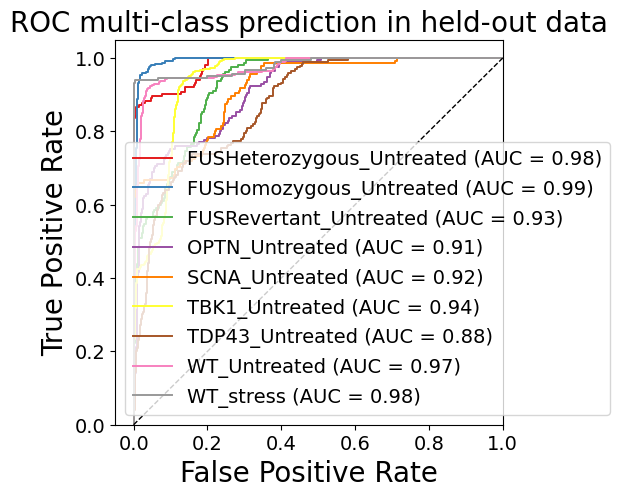

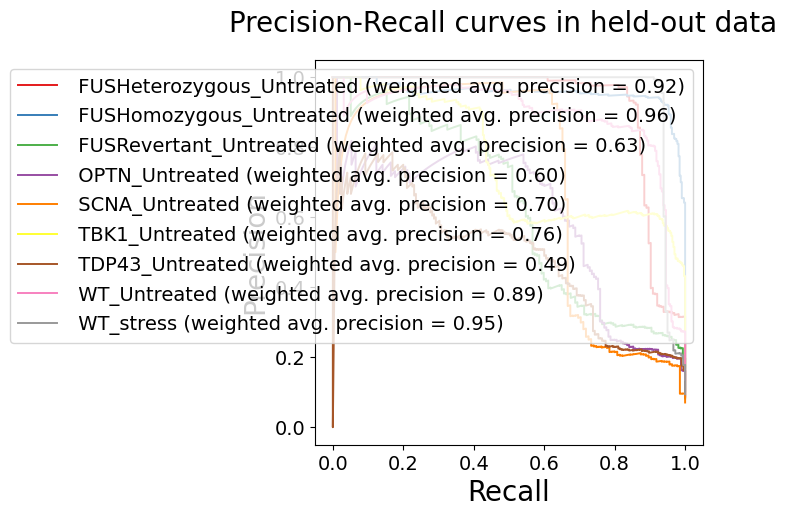

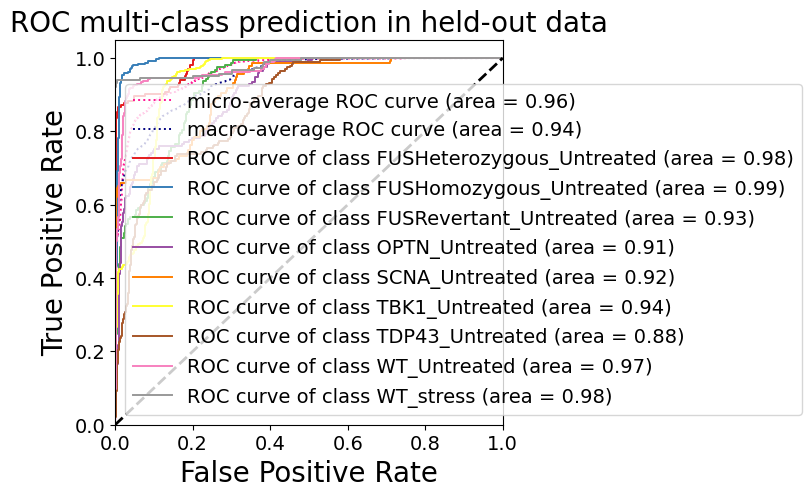


HELDOUT SET - AUC ROC scores of each class: {0: 0.9809254889915814, 1: 0.9929171809792512, 2: 0.9260180551823312, 3: 0.9120045950603102, 4: 0.9152944611277946, 5: 0.9398409116983442, 6: 0.8761759607913453, 7: 0.9720053274056567, 8: 0.9804095256434944, 'micro': 0.961624683283127, 'macro': 0.9442359849249815}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.00      0.00      0.00       164
  FUSHomozygous_Untreated       0.64      0.99      0.78       321
   FUSRevertant_Untreated       0.73      0.14      0.24       157
           OPTN_Untreated       0.66      0.61      0.64       170
           SCNA_Untreated       0.92      0.65      0.76       135
           TBK1_Untreated       0.55      0.96      0.70       331
          TDP43_Untreated       0.74      0.36      0.49       195
             WT_Untreated       0.82      0.89      0.86       258
                WT_stress       0.99      0.92

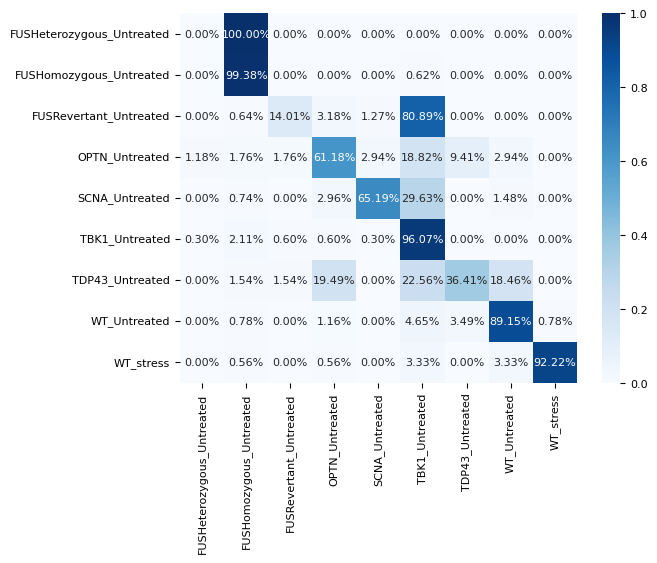


HELDOUT SET - One-vs-rest Confusion Matrix:
[[  0 164   0   0   0   0   0   0   0]
 [  0 319   0   0   0   2   0   0   0]
 [  0   1  22   5   2 127   0   0   0]
 [  2   3   3 104   5  32  16   5   0]
 [  0   1   0   4  88  40   0   2   0]
 [  1   7   2   2   1 318   0   0   0]
 [  0   3   3  38   0  44  71  36   0]
 [  0   2   0   3   0  12   9 230   2]
 [  0   1   0   1   0   6   0   6 166]]
Sensitivity, hit rate, recall, or true positive rate: [0.         0.99376947 0.14012739 0.61176471 0.65185185 0.96072508
 0.36410256 0.89147287 0.92222222]
Specificity or true negative rate: [0.99828277 0.88553459 0.995439   0.96955773 0.9954955  0.8335443
 0.98543124 0.97035693 0.9988446 ]
Precision or positive predictive value: [0.         0.63672655 0.73333333 0.66242038 0.91666667 0.54733219
 0.73958333 0.82437276 0.98809524]
Negative predictive value: [0.91404612 0.99858156 0.92822967 0.96237172 0.97410468 0.99022556
 0.93168044 0.98284314 0.99196787]
Fall out or false positive rate: [0.0017

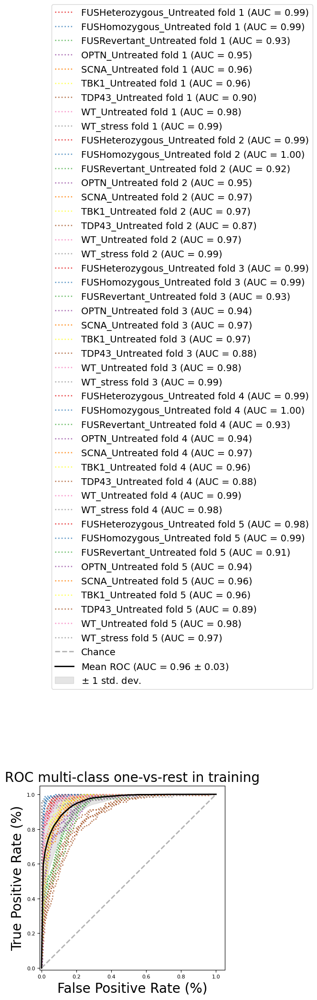



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.9897236  0.99241979 0.92509249 0.94500338 0.96382959 0.95839503
 0.89963957 0.98206494 0.98832481 0.99245378 0.99629249 0.9229429
 0.94790127 0.97024787 0.96966205 0.86977328 0.96981955 0.99356199
 0.99217564 0.9944864  0.92733286 0.94140889 0.96686515 0.96886718
 0.87626149 0.98470617 0.99059188 0.99260138 0.99611201 0.93032644
 0.93808194 0.96888234 0.96163671 0.88488637 0.98533041 0.98236794
 0.98451425 0.99283936 0.91244476 0.93969317 0.95898391 0.96097342
 0.89095556 0.97945522 0.97459558] Mean: 0.958989440721618
Validating - Validate classifier

------------------

Balanced accuracy score: 0.719418775146096. 
Balanced accuracy score (adjusted): 0.6843461220393581


One-vs-One ROC AUC scores:
0.962393 (macro),
0.964788 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.964086 (macro),
0.968156 (weighted by prevalence)


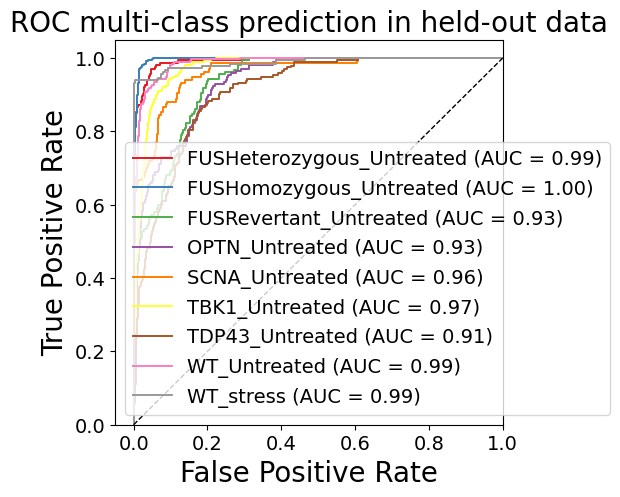

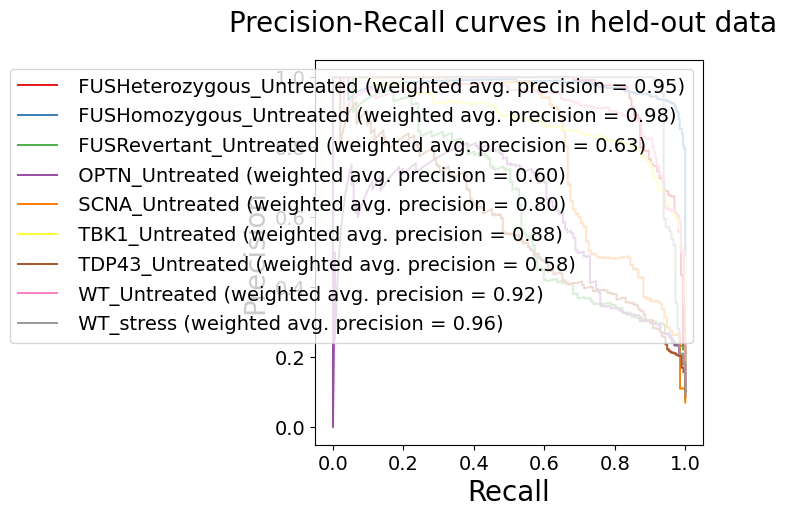

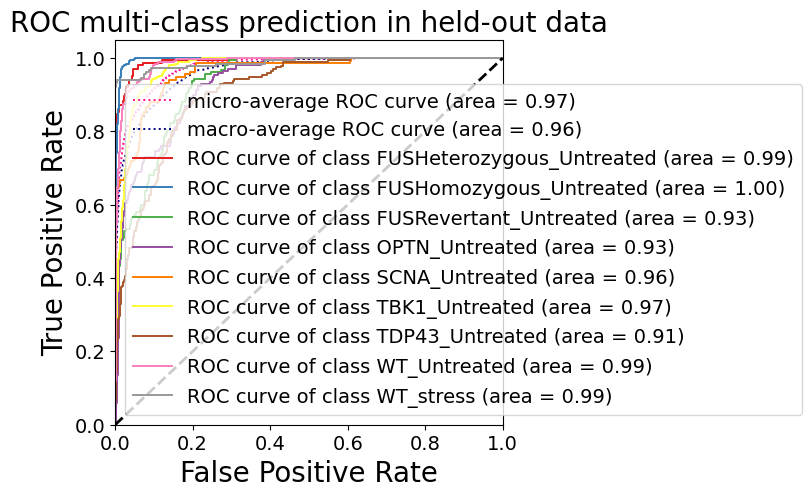


HELDOUT SET - AUC ROC scores of each class: {0: 0.9925167883619306, 1: 0.9964732851348969, 2: 0.9330229720602227, 3: 0.9330911916748319, 4: 0.9620036703370036, 5: 0.9745879383532832, 6: 0.9103490526567449, 7: 0.9867565197409455, 8: 0.9879741960331214, 'micro': 0.9749135112725603, 'macro': 0.9643075539422727}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.97      0.84      0.90       164
  FUSHomozygous_Untreated       0.91      0.97      0.94       321
   FUSRevertant_Untreated       0.77      0.32      0.46       157
           OPTN_Untreated       0.60      0.66      0.63       170
           SCNA_Untreated       0.91      0.65      0.76       135
           TBK1_Untreated       0.56      0.96      0.71       331
          TDP43_Untreated       0.74      0.25      0.38       195
             WT_Untreated       0.83      0.90      0.86       258
                WT_stress       0.99      0.9

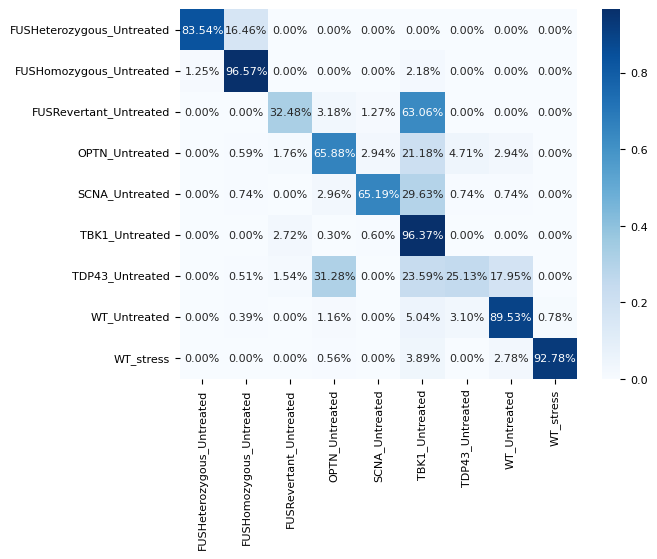


HELDOUT SET - One-vs-rest Confusion Matrix:
[[137  27   0   0   0   0   0   0   0]
 [  4 310   0   0   0   7   0   0   0]
 [  0   0  51   5   2  99   0   0   0]
 [  0   1   3 112   5  36   8   5   0]
 [  0   1   0   4  88  40   1   1   0]
 [  0   0   9   1   2 319   0   0   0]
 [  0   1   3  61   0  46  49  35   0]
 [  0   1   0   3   0  13   8 231   2]
 [  0   0   0   1   0   7   0   5 167]]
Sensitivity, hit rate, recall, or true positive rate: [0.83536585 0.96573209 0.32484076 0.65882353 0.65185185 0.96374622
 0.25128205 0.89534884 0.92777778]
Specificity or true negative rate: [0.99771036 0.98050314 0.99144812 0.95692131 0.99493243 0.84303797
 0.99009324 0.97217181 0.9988446 ]
Precision or positive predictive value: [0.97163121 0.90909091 0.77272727 0.59893048 0.90721649 0.56261023
 0.74242424 0.83393502 0.98816568]
Negative predictive value: [0.98474576 0.99299363 0.94254743 0.96635731 0.97409041 0.99107143
 0.92086721 0.98347613 0.99253731]
Fall out or false positive rate: [0.002

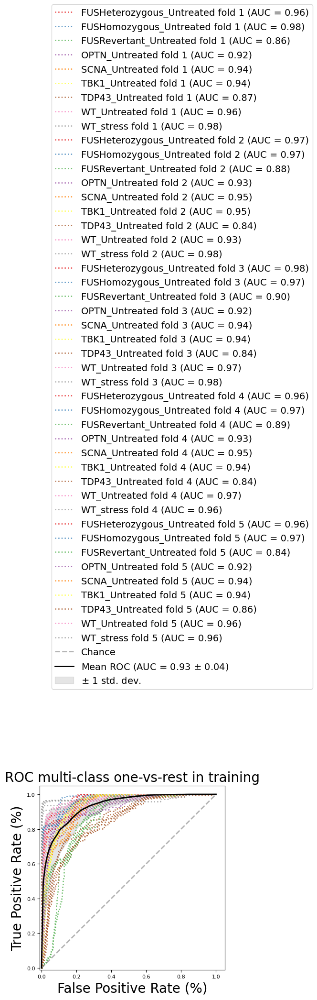



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.95960423 0.97960257 0.85609069 0.92466534 0.93878203 0.93623119
 0.86919902 0.96356713 0.98360226 0.97410696 0.96766329 0.88043195
 0.92847114 0.95041312 0.94908049 0.83823557 0.93358401 0.9818868
 0.97655442 0.96858995 0.90247185 0.92138375 0.94058356 0.94472878
 0.83858488 0.96720914 0.98065691 0.96258067 0.96934305 0.89251033
 0.92599505 0.94814154 0.93677826 0.8358423  0.9706498  0.96016478
 0.96399591 0.96929407 0.84236066 0.91535987 0.93683367 0.94227282
 0.85716155 0.95996064 0.96298972] Mean: 0.9335159047909124
Validating - Validate classifier

------------------

Balanced accuracy score: 0.2150553716256627. 
Balanced accuracy score (adjusted): 0.11693729307887056


One-vs-One ROC AUC scores:
0.933102 (macro),
0.935407 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.933584 (macro),
0.940007 (weighted by prevalence)


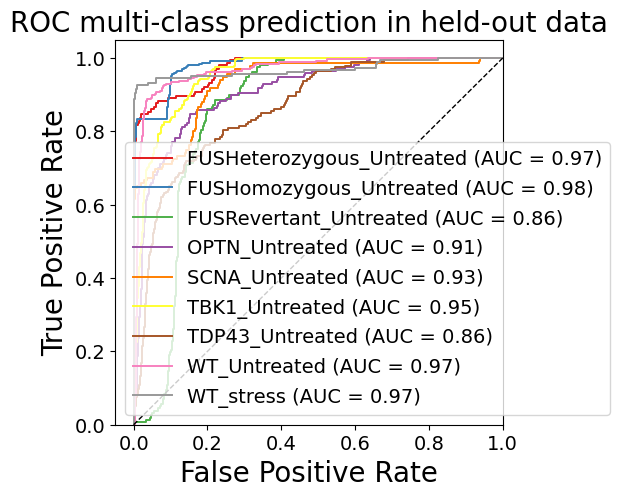

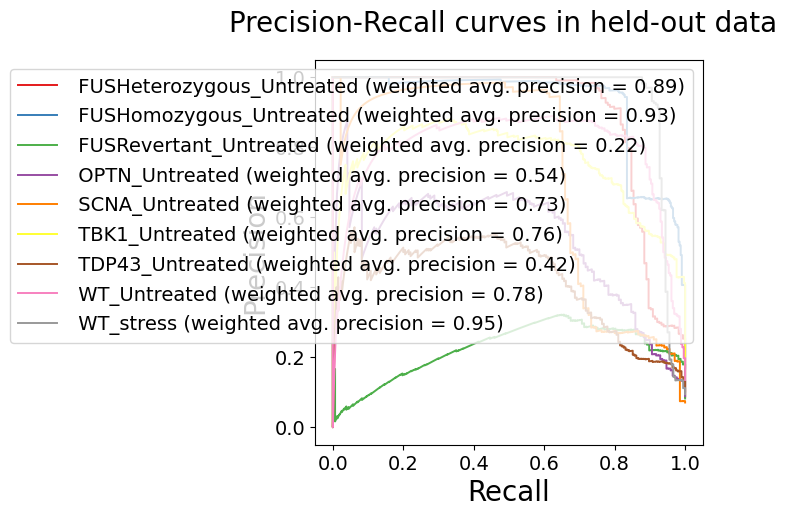

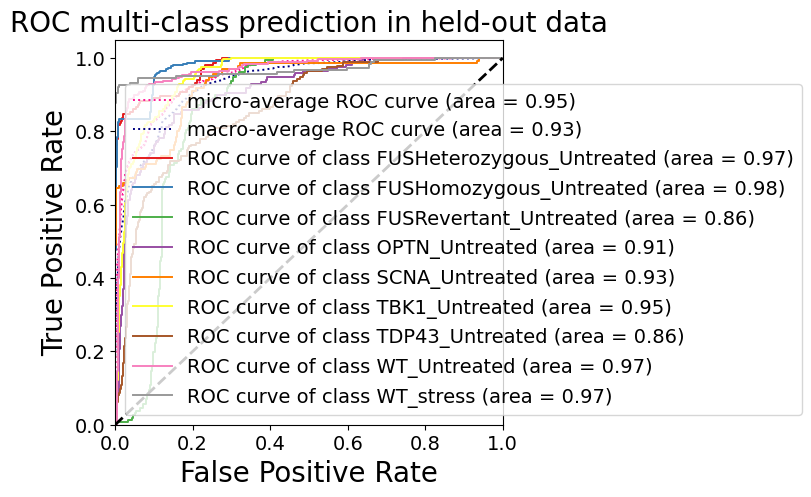


HELDOUT SET - AUC ROC scores of each class: {0: 0.9733131361078922, 1: 0.9793079801720254, 2: 0.8555948550719376, 3: 0.9108794810284826, 4: 0.9308808808808808, 5: 0.9520172855558529, 6: 0.86463152232383, 7: 0.9665466124546866, 8: 0.9690833814750626, 'micro': 0.9478958813731184, 'macro': 0.9339418160172563}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.87      0.75      0.81       164
  FUSHomozygous_Untreated       0.76      0.79      0.77       321
   FUSRevertant_Untreated       0.00      0.00      0.00       157
           OPTN_Untreated       0.00      0.00      0.00       170
           SCNA_Untreated       0.00      0.00      0.00       135
           TBK1_Untreated       0.10      0.37      0.16       331
          TDP43_Untreated       0.11      0.03      0.04       195
             WT_Untreated       0.00      0.00      0.00       258
                WT_stress       0.00      0.00 

/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter t

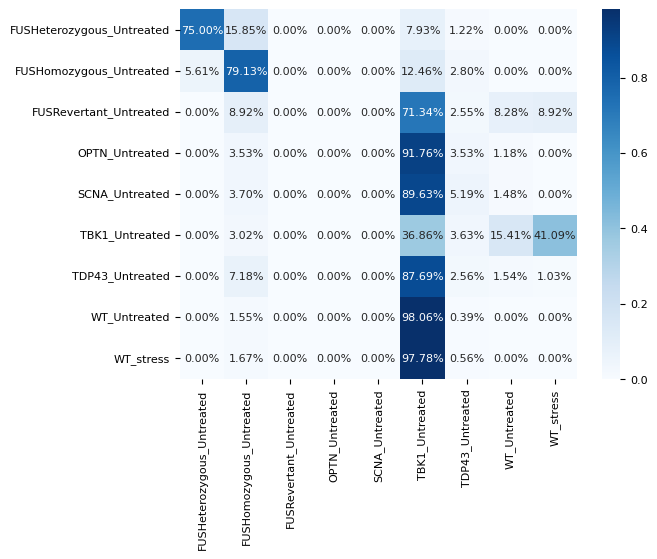


HELDOUT SET - One-vs-rest Confusion Matrix:
[[123  26   0   0   0  13   2   0   0]
 [ 18 254   0   0   0  40   9   0   0]
 [  0  14   0   0   0 112   4  13  14]
 [  0   6   0   0   0 156   6   2   0]
 [  0   5   0   0   0 121   7   2   0]
 [  0  10   0   0   0 122  12  51 136]
 [  0  14   0   0   0 171   5   3   2]
 [  0   4   0   0   0 253   1   0   0]
 [  0   3   0   0   0 176   1   0   0]]
Sensitivity, hit rate, recall, or true positive rate: [0.75       0.79127726 0.         0.         0.         0.36858006
 0.02564103 0.         0.        ]
Specificity or true negative rate: [0.98969662 0.94842767 1.         1.         1.         0.34050633
 0.97552448 0.95704779 0.91218949]
Precision or positive predictive value: [0.87234043 0.75595238        nan        nan        nan 0.104811
 0.10638298 0.         0.        ]
Negative predictive value: [0.97683616 0.95746032 0.91784406 0.91104134 0.92935636 0.72021419
 0.89806867 0.85978261 0.89766913]
Fall out or false positive rate: [0.01030

/tmp/ipykernel_40869/3679406993.py:198: RuntimeWarning: invalid value encountered in divide
  PPV = TP / (TP + FP)
/tmp/ipykernel_40869/3679406993.py:210: RuntimeWarning: invalid value encountered in divide
  FDR = FP / (TP + FP)


Performance score roc_auc_ovr_weighted on the held-out test-set (25%): 0.26373626373626374


In [8]:
# SVC
kernels = ['linear', 'poly', 'rbf', 'sigmoid']



for kernel in kernels:
    print(f"---------------------- Kernel = {kernel} ---------------------")
    svc = SVC(kernel=kernel, random_state=1, probability=True)
    fit_eval(svc, X, y)

---------------

### Eval

In [ ]:
mlp = mlp.fit(X9, y9)

In [ ]:

val_classifier(mlp, X5, y5.reshape(-1,), np.unique(y5.reshape(-1,)))

### Fit & Eval

#### vqvec1

In [ ]:
fit_eval(mlp, X, y)

#### vqvec2

In [ ]:
fit_eval(mlp, X, y)

#### y shuffled

##### vqvec1

In [ ]:
y_shuffled = np.copy(y)
np.random.shuffle(y_shuffled)
fit_eval(rfc, X, y_shuffled)

##### vqvec2

In [ ]:
y_shuffled = np.copy(y)
np.random.shuffle(y_shuffled)
fit_eval(mlp, X, y_shuffled)